<span>
    <b>Author</b>: Lorenzo Santino 605004 - Giuliano Galloppi 646443<br/>
    <b>Python version:</b>  3.x<br/>
</span>

In [2]:
%matplotlib inline 

import numpy as np
import pandas as pd
import seaborn as sns
import scipy as sci
import math
import matplotlib.pyplot as plt
import datetime

from sklearn.neighbors import KernelDensity

In [3]:
from matplotlib import style
style.use('dark_background')

#pd.set_option('display.max_rows', None)
pd.set_option("display.max_columns", None)

# **<font color=red> Task 1: Data Understanding and Preparation </font>**

In [4]:
# Read the dataset using Panda Library
df_matches = pd.read_csv("tennis_matches.csv", skipinitialspace=True, sep=",")
df_male    = pd.read_csv("male_players.csv",   skipinitialspace=True, sep=",")
df_female  = pd.read_csv("female_players.csv", skipinitialspace=True, sep=",")

n_starting_records_df_matches = df_matches.shape[0]
n_starting_records_df_male    = df_male.shape[0]
n_starting_records_df_female  = df_female.shape[0]

n_starting_attributes_df_matches = df_matches.shape[1]
n_starting_attributes_df_male    = df_male.shape[1]
n_starting_attributes_df_female  = df_female.shape[1]

print("Shape of Tennis Matches\t dataset:\t" + str(df_matches.shape))
print("Shape of Male Players\t dataset:\t" + str(df_male.shape))
print("Shape of Female Players\t dataset:\t" + str(df_female.shape))

Shape of Tennis Matches	 dataset:	(186128, 50)
Shape of Male Players	 dataset:	(55208, 2)
Shape of Female Players	 dataset:	(46172, 2)


### **<font color=orange> 1.1 Data Understanding </font>**
Explore the dataset with the analytical tools studied and write a concise “data understanding” report assessing data quality, the distribution of the variables and the pairwise correlations <br>

Let's start observing a global panoramic of attribute of matches data set

In [5]:
df_matches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186128 entries, 0 to 186127
Data columns (total 50 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Unnamed: 0          186128 non-null  int64  
 1   tourney_id          186073 non-null  object 
 2   tourney_name        186103 non-null  object 
 3   surface             185940 non-null  object 
 4   draw_size           186099 non-null  float64
 5   tourney_level       186099 non-null  object 
 6   tourney_date        186100 non-null  float64
 7   match_num           186101 non-null  float64
 8   winner_id           186073 non-null  float64
 9   winner_entry        25827 non-null   object 
 10  winner_name         186101 non-null  object 
 11  winner_hand         186082 non-null  object 
 12  winner_ht           49341 non-null   float64
 13  winner_ioc          186099 non-null  object 
 14  winner_age          183275 non-null  float64
 15  loser_id            186100 non-nul

We drop the first (unnamed) column because it's useless: it only a ID for the records

In [6]:
df_matches = df_matches.loc[:,~df_matches.columns.str.match("Unnamed")]

#### **<font color=turquoise> 1.1.1 Data quality - Duplicate data </font>**

In [7]:
# Helper function

def discard_duplicate_records(df):
    df_without_duplicates = df.drop_duplicates()
    
    return df_without_duplicates, (len(df) - len(df_without_duplicates))

We start to drop all the duplicated record presents in any dataset

In [8]:
df_matches, discarded_matches_duplicate = discard_duplicate_records(df_matches)
df_male,    discarded_male_duplicate    = discard_duplicate_records(df_male)
df_female,  discarded_female_duplicate  = discard_duplicate_records(df_female)

print("Discarded {} ({:.2f} %)\t duplicate records from the Tennis Matches dataset".format(discarded_matches_duplicate, discarded_matches_duplicate / n_starting_records_df_matches * 100))
print("Discarded {} ({:.2f} %)\t duplicate records from the Male Players dataset".format(discarded_male_duplicate,      discarded_male_duplicate    / n_starting_records_df_male    * 100))
print("Discarded {} ({:.2f} %)\t duplicate records from the Female Players dataset".format(discarded_female_duplicate,  discarded_female_duplicate  / n_starting_records_df_female  * 100))


Discarded 309 (0.17 %)	 duplicate records from the Tennis Matches dataset
Discarded 524 (0.95 %)	 duplicate records from the Male Players dataset
Discarded 511 (1.11 %)	 duplicate records from the Female Players dataset


#### **<font color=turquoise> 1.1.2 Data quality - Wrong data </font>** <br>
We check, for each attribute, the presents of null records, the syntactic accuracy and the semantic accuracy

In [9]:
# Helper functions

def clear_null_records(df):
    mask = df.isnull().any(axis=1)
    return df[~mask], df[mask]

def clear_null_records_for_attribute(df, attribute):
    mask = df[attribute].isnull()
    return df[~mask], df[mask]

def print_null_attribute(df):
    for col in df.columns:
        col_null     = df[col].isnull().sum()
        col_not_null = df[col].notna().sum()
        print("Null records for the attribute  {}:\t {} ({:.2f} %).".format(col, col_null, col_null / (col_not_null + col_null) * 100))
    print("")

def hamplex_X84_attribute(df, attribute, theta):
    attribute_median = df[attribute].median()
    attribute_mad    = df[attribute].mad()
    attribute_theta  = theta
    attribute_left_bound  = attribute_median - (attribute_mad * 1.4826 * attribute_theta)
    attribute_right_bound = attribute_median + (attribute_mad * 1.4826 * attribute_theta)
    return attribute_left_bound, attribute_right_bound

#### **<font color=violet> 1.1.2.1 Data quality - Female and Male dataset </font>**

We start to check the syntactic correctness of the <font color=green>attributes</font>. That means find the null values and records with a wrong syntax. <br>

In [10]:
# Helper function

def select_records_len_less_than(df, attribute, n):
    df["lenght"] = df[attribute].astype(str).map(len)
    return df.loc[df["lenght"] >= n], (len(df) -  len(df[df["lenght"] >= n]))

In [11]:
print_null_attribute(df_male)
print_null_attribute(df_female)

Null records for the attribute  name:	 125 (0.23 %).
Null records for the attribute  surname:	 1 (0.00 %).

Null records for the attribute  name:	 1572 (3.44 %).
Null records for the attribute  surname:	 0 (0.00 %).



#### **<font color=lime> name - surname</font>** : name and surname of players

Check the null records <br>

We discard **all** null records because we don't really care about the data set of players name, we just need the players that are present in the dataset

In [12]:
df_male,   df_male_null   = clear_null_records(df_male)
df_female, df_female_null = clear_null_records(df_female)

discarded_male_null   = len(df_male_null)
discarded_female_null = len(df_female_null)
 
print("Discarded {} ({:.2f} %)\t null records from the Male Players dataset.".format(discarded_male_null,     discarded_male_null   / n_starting_records_df_male   * 100 ))
print("Discarded {} ({:.2f} %)\t null records from the Female Players dataset.".format(discarded_female_null, discarded_female_null / n_starting_records_df_female * 100))


Discarded 125 (0.23 %)	 null records from the Male Players dataset.
Discarded 1572 (3.40 %)	 null records from the Female Players dataset.


Check wrong syntax. <br>

We made this assumption: we accept as correct just the string having a length *greater than 1*.

In [13]:
df_male, discarded_male_name   = select_records_len_less_than(df_male, "name", 2)
df_male, discared_male_surname = select_records_len_less_than(df_male, "surname", 2)

df_female, discarded_female_name   = select_records_len_less_than(df_female, "name", 2)
df_female, discared_female_surname = select_records_len_less_than(df_female, "surname", 2)

discared_male_wrong_syntax = discarded_male_name + discared_male_surname
discared_female_wrong_syntax = discarded_female_name + discared_female_surname

print("Discarded {} ({:.2f} %)\t wrong syntax records from the Male Players dataset.".format(discared_male_wrong_syntax,     discared_male_wrong_syntax   / n_starting_records_df_male   * 100 ))
print("Discarded {} ({:.2f} %)\t wrong syntax records from the Female Players dataset.".format(discared_female_wrong_syntax, discared_female_wrong_syntax / n_starting_records_df_female * 100 ))

Discarded 1009 (1.83 %)	 wrong syntax records from the Male Players dataset.
Discarded 3726 (8.07 %)	 wrong syntax records from the Female Players dataset.


Wrap up: we count how many records we discard after this analysis

In [14]:
discarded_male_total   = discarded_male_null   + discared_male_wrong_syntax
discarded_female_total = discarded_female_null + discared_female_wrong_syntax

print("Discarded {} ({:.2f} %)\t not correct records from the Male Players dataset.".format(discarded_male_total,     discarded_male_total    / n_starting_records_df_male * 100 ))
print("Discarded {} ({:.2f} %)\t not correct records from the Female Players dataset.".format(discarded_female_total, discarded_female_total / n_starting_records_df_female * 100 ))

Discarded 1134 (2.05 %)	 not correct records from the Male Players dataset.
Discarded 5298 (11.47 %)	 not correct records from the Female Players dataset.


#### **<font color=violet> 1.1.2.1 Data quality - Tennis Match dataset </font> <br>**

We make our analysis **attribute** by **attribute**. <br>
Since the tennis match datases have **49 attribute**, we start to analyse first the *core attribute* of the tennis match dataset. We define as *core attribute* (marked as *) attribute such that if they missing we cannot determine a tennis match.

In [15]:
print_null_attribute(df_matches)

Null records for the attribute  tourney_id:	 55 (0.03 %).
Null records for the attribute  tourney_name:	 25 (0.01 %).
Null records for the attribute  surface:	 188 (0.10 %).
Null records for the attribute  draw_size:	 29 (0.02 %).
Null records for the attribute  tourney_level:	 29 (0.02 %).
Null records for the attribute  tourney_date:	 28 (0.02 %).
Null records for the attribute  match_num:	 27 (0.01 %).
Null records for the attribute  winner_id:	 55 (0.03 %).
Null records for the attribute  winner_entry:	 160008 (86.11 %).
Null records for the attribute  winner_name:	 27 (0.01 %).
Null records for the attribute  winner_hand:	 46 (0.02 %).
Null records for the attribute  winner_ht:	 136516 (73.47 %).
Null records for the attribute  winner_ioc:	 29 (0.02 %).
Null records for the attribute  winner_age:	 2853 (1.54 %).
Null records for the attribute  loser_id:	 28 (0.02 %).
Null records for the attribute  loser_entry:	 141731 (76.27 %).
Null records for the attribute  loser_name:	 31 (0.

#### **<font color=lime> winner_name (*) </font>** - **<font color=lime> loser_name (*)</font>** : *the name and surname of the winner or loser player*

In [16]:
# Heper Functions

def set_gender_winner(df, name, gender):
    df.loc[df["winner_name"] == name, "winner_sex"] = gender
    return df

def set_gender_loser(df, name, gender):
    df.loc[df["loser_name"] == name, "loser_sex"] = gender
    return df

def set_gender_player(df, name, gender):
    df = set_gender_winner(df, name, gender)
    df = set_gender_loser(df, name, gender)
    return df

def set_opposite_gender_player(df):
    df.loc[(df["winner_sex"] == "Unknow") & (df["loser_sex"] == "Male"),   "winner_sex"] = "Male"
    df.loc[(df["winner_sex"] == "Unknow") & (df["loser_sex"] == "Female"), "winner_sex"] = "Female"
    df.loc[(df["winner_sex"] == "Male")   & (df["loser_sex"] == "Unknow"), "loser_sex"]  = "Male"
    df.loc[(df["winner_sex"] == "Female") & (df["loser_sex"] == "Unknow"), "loser_sex"]  = "Female"
    return df

Check if there are missing values

In [17]:
df_matches_winner_name_null_records = df_matches["winner_name"].isnull().sum()
print("Discovered\t" + str(df_matches["winner_name"].isnull().sum()) + "\t null records for the winner_name attribute")

Discovered	27	 null records for the winner_name attribute


We select records that have null values

In [18]:
df_matches, df_matches_winner_name_null = clear_null_records_for_attribute(df_matches, "winner_name")

The winner_name is a core information that describe a tennis match. <br>
We can use a <font color=red> *data driven* </font> approach to find this missing value, but we need more to identify a match: we need the **loser_name**, the **tourney_name**, the **winner_ioc** and the **loser_ioc**. <br> <br>
We create a separate view where the tourney_name and the tourney_date is not null (minimal information to retrieve the match).<br>
Our hope is that this information is unique, otherwise we will discard the record. <br> <br>
For better understand the results, we just view the **tourney_name**, the **tourney_date**, the **winner_name**, the **winner_ioc**, the **loser_name** and the **loser_ioc**


<div class="alert alert-block alert-info"><b>Note:</b> We trust the <b> wtatennis.com </b> as source of information</div>

In [19]:
view_winner_name_null = df_matches_winner_name_null.loc[(df_matches_winner_name_null["tourney_name"].notna()) & (df_matches_winner_name_null["tourney_date"].notna())].copy()
view_winner_name_null.loc[:, ["tourney_name", "tourney_date", "winner_name", "winner_ioc", "loser_name", "loser_ioc"]]

,tourney_name,tourney_date,winner_name,winner_ioc,loser_name,loser_ioc
186073,Taipei,20171113.0,NaN,JPN,NaN,NaN
186074,Taipei,20171113.0,NaN,NaN,Sara Errani,ITA
186084,Taipei,20171113.0,NaN,NaN,Ying Ying Duan,CHN
186095,Taipei,20171113.0,NaN,THA,Marie Bouzkova,NaN
186099,Taipei,20171113.0,NaN,SUI,NaN,SUI
186105,Taipei,20171113.0,NaN,RUS,NaN,NaN
186113,Taipei,20171113.0,NaN,NaN,NaN,NaN
186118,Taipei,20171113.0,NaN,NaN,Victoria Rodriguez,NaN


Now we analyse record by record and we retrieve information about the match using the previous information. <br>

For the record ID 186073 we can't retrieve a unique match for the Taipei 2017 tournament where a JPN player won a round, then we will discard the record <br>
For the record ID 186074 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS030 <br>
For the record ID 186084 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS020 <br>
For the record ID 186095 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS009 <br>
For the record ID 186099 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS005 <br>
For the record ID 186105 we can't retrieve a unique match for the Taipei 2017 tournament where a RUS player won a round, then we will discard the record <br>
For the record ID 186113 we can't retrive the match match because we dont have information about winner or loser, then we will discard the record <br>
For the record ID 186118 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/RS013

Now we update the view with this new information in order

In [20]:
view_winner_name_null.drop(view_winner_name_null[(view_winner_name_null["winner_ioc"] == "JPN") & (view_winner_name_null["loser_name"].isnull()) & (view_winner_name_null["loser_ioc"].isnull())].index, inplace=True)
view_winner_name_null.loc[view_winner_name_null["loser_name"] == "Sara Errani", "winner_name"] = "Lizette Cabrera"
view_winner_name_null.loc[view_winner_name_null["loser_name"] == "Ying Ying Duan", "winner_name"] = "Belinda Bencic"
view_winner_name_null.loc[view_winner_name_null["loser_name"] == "Marie Bouzkova", "winner_name"] = "Luksika Kumkhum"
view_winner_name_null.loc[view_winner_name_null["loser_ioc"] == "SUI", "winner_name"] = "Belinda Bencic"
view_winner_name_null.drop(view_winner_name_null[(view_winner_name_null["winner_ioc"] == "RUS") & (view_winner_name_null["loser_name"].isnull()) & (view_winner_name_null["loser_ioc"].isnull())].index, inplace=True)
view_winner_name_null.drop(view_winner_name_null[(view_winner_name_null["winner_ioc"].isnull()) & (view_winner_name_null["loser_name"].isnull()) & (view_winner_name_null["loser_ioc"].isnull())].index, inplace=True)
view_winner_name_null.loc[view_winner_name_null["loser_name"] == "Victoria Rodriguez", "winner_name"] = "Dalila Jakupovic"

view_winner_name_null_updated_records = len(view_winner_name_null)
view_winner_name_null[["tourney_name", "tourney_date", "winner_name", "winner_ioc", "loser_name", "loser_ioc"]]

,tourney_name,tourney_date,winner_name,winner_ioc,loser_name,loser_ioc
186074,Taipei,20171113.0,Lizette Cabrera,NaN,Sara Errani,ITA
186084,Taipei,20171113.0,Belinda Bencic,NaN,Ying Ying Duan,CHN
186095,Taipei,20171113.0,Luksika Kumkhum,THA,Marie Bouzkova,NaN
186099,Taipei,20171113.0,Belinda Bencic,SUI,NaN,SUI
186118,Taipei,20171113.0,Dalila Jakupovic,NaN,Victoria Rodriguez,NaN


As last step, we append the modfied view of winner name with the original tennis match frame

In [21]:
df_matches = df_matches.append(view_winner_name_null)

Wrap up:
> we count how many records we discard after this analysis

In [22]:
print("We start having\t " + str(df_matches_winner_name_null_records) + "\tnull records for the winner_name attribute")
print("We updated\t " + str(view_winner_name_null_updated_records) + "\tnull records for the winner_name attribute")
print("We discared\t " + str(df_matches_winner_name_null_records - view_winner_name_null_updated_records) + "\tnull records for the winner_name attribute")

We start having	 27	null records for the winner_name attribute
We updated	 5	null records for the winner_name attribute
We discared	 22	null records for the winner_name attribute


Now we repeat the same analysis for the **loser_name** attribute

Check if there are missing values

In [23]:
df_matches_loser_name_null_records = df_matches["loser_name"].isnull().sum()
print("We discover\t" + str(df_matches_loser_name_null_records) + "\t null records for the loser_name attribute")

We discover	20	 null records for the loser_name attribute


We select records that have null values

In [24]:
df_matches, df_matches_loser_name_null = clear_null_records_for_attribute(df_matches, "loser_name")

The loser_name is a core information that describe a tennis match. <br>
As for the previous attribute, we are going to use a <font color=red> *data driven* </font> approach to find this missing value using the same pre-conditions. <br>
For better understand the results, we just view the **tourney_name**, the **tourney_date**, the **winner_name**, the **winner_ioc**, the **loser_name** and the **loser_ioc**


In [25]:
view_loser_name_null = df_matches_loser_name_null[(df_matches_loser_name_null["tourney_name"].notna()) & (df_matches_loser_name_null["tourney_date"].notna())].copy()
view_loser_name_null[["tourney_name", "tourney_date", "winner_name", "winner_ioc", "loser_name", "loser_ioc"]]

,tourney_name,tourney_date,winner_name,winner_ioc,loser_name,loser_ioc
186078,Taipei,20171113.0,Veronika Kudermetova,NaN,NaN,NaN
186083,Taipei,20171113.0,Priscilla Hon,AUS,NaN,RUS
186103,Taipei,20171113.0,Belinda Bencic,NaN,NaN,NED
186116,Taipei,20171113.0,Ingrid Neel,NaN,NaN,CAN
186127,Taipei,20171113.0,Priscilla Hon,AUS,NaN,USA
186099,Taipei,20171113.0,Belinda Bencic,SUI,NaN,SUI


Now we analyse record by record and we retrieve information about the match using the previous information. <br>

For the record ID 186078 we can't retrieve any match because Kudermetova won 2 matches <br>
For the record ID 186083 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS021 <br>
For the record ID 186103 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS001 <br>
For the record ID 186116 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/RS015 <br>
For the record ID 186127 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/RS004 <br>
For the record ID 186099 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS005

Now we update, in order, the view with those new informations

In [26]:
view_loser_name_null.drop(view_loser_name_null[(view_loser_name_null["winner_ioc"].isnull()) & (view_loser_name_null["winner_name"] == "Veronika Kudermetova") & (view_loser_name_null["loser_ioc"].isnull())].index, inplace=True)
view_loser_name_null.loc[(view_loser_name_null["winner_name"] == "Priscilla Hon") & (view_loser_name_null["loser_ioc"] == "RUS"), "loser_name"] = "Irina Khromacheva"
view_loser_name_null.loc[view_loser_name_null["winner_name"] == "Belinda Bencic", "loser_name"] = "Arantxa Rus"
view_loser_name_null.loc[view_loser_name_null["winner_name"] == "Ingrid Neel", "loser_name"] = "Carol Zhao"
view_loser_name_null.loc[(view_loser_name_null["winner_name"] == "Priscilla Hon") & (view_loser_name_null["loser_ioc"] == "USA"), "loser_name"] = "Jacqueline Cako"
view_loser_name_null.loc[view_loser_name_null["winner_name"] == "Belinda Bencic", "loser_name"] = "Jil Teichmann"

view_loser_name_null_updated_records = len(view_loser_name_null)
view_loser_name_null[["tourney_name", "tourney_date", "winner_name", "winner_ioc", "loser_name", "loser_ioc"]]

,tourney_name,tourney_date,winner_name,winner_ioc,loser_name,loser_ioc
186083,Taipei,20171113.0,Priscilla Hon,AUS,Irina Khromacheva,RUS
186103,Taipei,20171113.0,Belinda Bencic,NaN,Jil Teichmann,NED
186116,Taipei,20171113.0,Ingrid Neel,NaN,Carol Zhao,CAN
186127,Taipei,20171113.0,Priscilla Hon,AUS,Jacqueline Cako,USA
186099,Taipei,20171113.0,Belinda Bencic,SUI,Jil Teichmann,SUI


As last step, we append the view of loser with the original tennis match frame

In [27]:
df_matches = df_matches.append(view_loser_name_null)

Wrap up:
> we count how many records we discard after this analysis

In [28]:
print("We start having\t " + str(df_matches_loser_name_null_records)                                       + "\tnull records for the loser_name attribute")
print("We updated\t "      + str(view_loser_name_null_updated_records)                                      + "\tnull records for the loser_name attribute")
print("We discared\t "     + str(df_matches_loser_name_null_records - view_loser_name_null_updated_records) + "\tnull records for the loser_name attribute")

We start having	 20	null records for the loser_name attribute
We updated	 5	null records for the loser_name attribute
We discared	 15	null records for the loser_name attribute


We want to extract two new attribute that describe the gender of the players: **winner_sex** and **loser_sex** from the **winner_name** and **loser_name** attribute.

In [29]:
df_matches["winner_sex"] = "Unknow"
df_matches["loser_sex"]  = "Unknow"

First of all, we cast all name to lower case to avoid some incorrect syntax, then we merge togheter the column name and surname in male and female dataset.

In [30]:
df_token_winner_name = df_matches["winner_name"].str.lower()
df_token_loser_name  = df_matches["loser_name"].str.lower()

df_token_male   = (df_male["name"] + " " + df_male["surname"]).str.lower()
df_token_female = (df_female["name"] + " " + df_female["surname"]).str.lower()

To determine the correct gender, we are going to search each record in the winner and loser name inside the the male and female dataset, and assing the correct gender (Male, Female).

In [31]:
df_matches["winner_sex"] = np.where(df_token_winner_name.isin(df_token_male), "Male", df_matches["winner_sex"])
df_matches["winner_sex"] = np.where(df_token_winner_name.isin(df_token_female), "Female", df_matches["winner_sex"])

df_matches["loser_sex"] = np.where(df_token_loser_name.isin(df_token_male),   "Male",   df_matches["loser_sex"])
df_matches["loser_sex"] = np.where(df_token_loser_name.isin(df_token_female), "Female", df_matches["loser_sex"])

We made this assumption: since the tournament have a unique gender, for the players, we can retrieve the oppositive gender looking the winner or the loser (not null) sex.

In [32]:
df_matches = set_opposite_gender_player(df_matches)

We check if we assign the gender to all players in the matche dataset.

In [33]:
df_matches.loc[(df_matches["winner_sex"] == "Unknow"), "winner_name"].drop_duplicates().append(df_matches.loc[(df_matches["loser_sex"] == "Unknow"), "loser_sex"].drop_duplicates())

59                      Cristian Garin
1305                    Pedro Martinez
1938                      Taylor Fritz
2658                     Stan Wawrinka
4142                 Diego Schwartzman
57447                   Frances Tiafoe
59015                     Lloyd Harris
78202                    Franko Skugor
82113            Christopher O'Connell
83642               Daniel Elahi Galan
84099               Jo-Wilfried Tsonga
89897                     Joao Menezes
93782              Juan Pablo Varillas
95475                      Holger Rune
101772    Andres Artunedo Martinavarro
110726                   Antoine Hoang
59                              Unknow
dtype: object

We apply a data driven approach to identify the gender of the (few) **Unknow** gender type of players.

In [34]:
df_matches = set_gender_player(df_matches, "Cristian Garin", "Male")
df_matches = set_gender_player(df_matches, "Pedro Martinez", "Male")
df_matches = set_gender_player(df_matches, "Taylor Fritz", "Male")
df_matches = set_gender_player(df_matches, "Diego Schwartzman", "Male")
df_matches = set_gender_player(df_matches, "Frances Tiafoe", "Male")
df_matches = set_gender_player(df_matches, "Lloyd Harris", "Male")
df_matches = set_gender_player(df_matches, "Franko Skugor", "Male")
df_matches = set_gender_player(df_matches, "Christopher O'Connell", "Male")
df_matches = set_gender_player(df_matches, "Daniel Elahi Galan", "Male")
df_matches = set_gender_player(df_matches, "Jo-Wilfried Tsonga", "Male")
df_matches = set_gender_player(df_matches, "Joao Menezes", "Male")
df_matches = set_gender_player(df_matches, "Juan Pablo Varillas", "Male")
df_matches = set_gender_player(df_matches, "Holger Rune", "Male")
df_matches = set_gender_player(df_matches, "Stan Wawrinka", "Male")
df_matches = set_gender_player(df_matches, "Andres Artunedo Martinavarro", "Male")
df_matches = set_gender_player(df_matches, "Antoine Hoang", "Male")

df_matches = set_opposite_gender_player(df_matches)

We analyze the distribution of Male and Female players in the matches dataset.

There are 0 (0.00 %)	 Unknow gender players
There are 60657 (32.66 %)	 Male gender players
There are 125086 (67.34 %)	 Female gender players


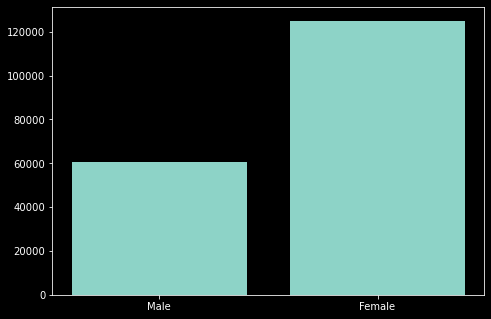

In [35]:
n_unknow_players = df_matches.loc[(df_matches["winner_sex"] == "Unknow") & (df_matches["loser_sex"] == "Unknow"), "winner_sex"].count()
n_male_players   = df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["loser_sex"] == "Male"), "winner_sex"].count()
n_female_players = df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["loser_sex"] == "Female"), "winner_sex"].count()

n_players = n_unknow_players + n_male_players + n_female_players

print("There are {} ({:.2f} %)\t Unknow gender players".format(n_unknow_players, n_unknow_players   / n_players * 100 ))
print("There are {} ({:.2f} %)\t Male gender players".format(n_male_players,   n_male_players     / n_players * 100 ))
print("There are {} ({:.2f} %)\t Female gender players".format(n_female_players, n_female_players   / n_players * 100 ))

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
gender = ["Male", "Female"]
players = [n_male_players, n_female_players]
ax.bar(gender, players)

plt.show()

#### **<font color=lime> tourney_date</font> (*)** : *the date of the tournament*

Check if there are missing value

In [36]:
print("We discover\t" + str(df_matches["tourney_date"].isnull().sum()) + "\t null records for the tourney_date attribute")

We discover	3	 null records for the tourney_date attribute


We would like to use again a *data driven* approach to replace the missing value. <br>
We need to select the null records for **tourney_date** where the **winner_name** and **loser_name** are not null (minimal information to retrieve the match). <br>

In [37]:
_, df_matches_tourney_date_null = clear_null_records_for_attribute(df_matches, "tourney_date")

df_matches_tourney_date_null_to_search = df_matches_tourney_date_null[df_matches_tourney_date_null[["winner_name","loser_name"]].notna().all(axis=1)]
df_matches_tourney_date_null_to_search[["tourney_name", "winner_name", "loser_name"]]

,tourney_name,winner_name,loser_name
186082,NaN,Jil Belen Teichmann,Ching Wen Hsu
186092,Taipei,Naomi Broady,Su Jeong Jang
186115,Taipei,Priscilla Hon,Jacqueline Cako


Before we retrieve information about the missing values, we make another manually check, for each record we want to change, becuse maybe it could be a duplicate.

In [38]:
df_matches[(df_matches["winner_name"] == "Jil Belen Teichmann") & (df_matches["loser_name"] == "Ching Wen Hsu")]

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
12032,2017-1059,Taipei,Hard,32.0,C,20171113.0,279.0,213525.0,NaN,Jil Belen Teichmann,L,NaN,SUI,20.33128,210931.0,WC,Ching Wen Hsu,R,NaN,TPE,21.234771,6-3 6-1,3.0,R32,55.0,0.0,0.0,39.0,23.0,21.0,11.0,8.0,0.0,0.0,0.0,4.0,50.0,30.0,17.0,8.0,8.0,7.0,11.0,146.0,394.0,566.0,46.0,3535.0,638954.72,Female,Female
186082,NaN,NaN,NaN,NaN,C,NaN,279.0,NaN,NaN,Jil Belen Teichmann,L,NaN,SUI,20.33128,210931.0,WC,Ching Wen Hsu,R,NaN,TPE,NaN,NaN,3.0,NaN,55.0,0.0,0.0,NaN,NaN,21.0,NaN,NaN,NaN,NaN,0.0,4.0,50.0,NaN,17.0,8.0,NaN,NaN,11.0,NaN,394.0,566.0,NaN,3535.0,NaN,Female,Female


By comparing the second record with the first, we can easily observe how it is duplicated, the we can discard the record.

In [39]:
df_matches[(df_matches["winner_name"] == "Naomi Broady") & (df_matches["loser_name"] == "Su Jeong Jang") & (df_matches["tourney_name"] == "Taipei")]

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
12042,2017-1059,Taipei,Hard,32.0,C,20171113.0,289.0,201648.0,NaN,Naomi Broady,R,189.0,GBR,27.70705,204294.0,NaN,Su Jeong Jang,R,NaN,KOR,22.672142,4-6 6-1 7-5,3.0,R16,118.0,16.0,4.0,90.0,57.0,46.0,17.0,15.0,3.0,4.0,3.0,5.0,84.0,55.0,40.0,15.0,14.0,1.0,4.0,122.0,501.0,185.0,316.0,3535.0,638954.72,Female,Female
186092,NaN,Taipei,NaN,NaN,NaN,NaN,289.0,NaN,NaN,Naomi Broady,R,NaN,NaN,NaN,NaN,NaN,Su Jeong Jang,NaN,NaN,KOR,NaN,NaN,NaN,R16,NaN,16.0,4.0,90.0,57.0,46.0,17.0,NaN,3.0,NaN,NaN,NaN,84.0,55.0,NaN,NaN,14.0,NaN,NaN,NaN,501.0,NaN,NaN,3535.0,638954.72,Female,Female


By comparing the second record with the first, we can easily observe how it is duplicated, then we can discard the records.

In [40]:
df_matches[(df_matches["winner_name"] == "Priscilla Hon") & (df_matches["loser_name"] == "Jacqueline Cako") & (df_matches["tourney_name"] == "Taipei")]

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
12065,2017-1059,Taipei,Hard,32.0,C,20171113.0,254.0,211880.0,NaN,Priscilla Hon,R,NaN,AUS,19.512663,202614.0,NaN,Jacqueline Cako,R,NaN,USA,26.206708,6-4 6-4,3.0,Q2,78.0,5.0,2.0,64.0,42.0,28.0,13.0,10.0,4.0,6.0,8.0,1.0,63.0,43.0,25.0,9.0,10.0,4.0,8.0,231.0,243.0,181.0,322.0,3535.0,638954.72,Female,Female
186115,NaN,Taipei,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Priscilla Hon,R,NaN,AUS,19.512663,202614.0,NaN,Jacqueline Cako,NaN,NaN,NaN,NaN,6-4 6-4,3.0,NaN,78.0,NaN,2.0,64.0,NaN,NaN,NaN,10.0,4.0,NaN,NaN,NaN,63.0,43.0,25.0,9.0,10.0,NaN,NaN,NaN,243.0,181.0,322.0,NaN,NaN,Female,Female
186127,NaN,Taipei,Hard,32.0,C,20171113.0,NaN,NaN,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,NaN,NaN,Jacqueline Cako,NaN,NaN,USA,NaN,6-4 6-4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,8.0,NaN,NaN,43.0,25.0,9.0,10.0,4.0,8.0,NaN,NaN,181.0,322.0,3535.0,638954.72,Female,Female


By comparing the second record with the first or the last, we can easily observe how it is duplicated, then we can discard the records.

In [41]:
df_matches, df_matches_tourney_date_null = clear_null_records_for_attribute(df_matches, "tourney_date")

Now we make suitable the syntax; for do this we cast the type of the attribute, from **String** into **Datetime**

In [42]:
df_matches["tourney_date"] = pd.to_datetime(df_matches["tourney_date"], format="%Y%m%d")

#### **<font color=lime> tourney_name (*)</font>** : *the name of the tourney*

Check if they are missing values

In [43]:
print("We discover\t" + str(df_matches["tourney_name"].isnull().sum()) + "\t null records for the tourney_name attribute")

We discover	2	 null records for the tourney_name attribute


Select the null records for the attribute

In [44]:
_, df_matches_tourney_name_null = clear_null_records_for_attribute(df_matches, "tourney_name")
df_matches_tourney_name_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186085,NaN,NaN,Hard,NaN,NaN,2017-11-13,NaN,NaN,NaN,Luksika Kumkhum,R,NaN,NaN,NaN,NaN,NaN,Ana Bogdan,NaN,NaN,ROU,NaN,2-6 7-6(9) 7-5,NaN,R32,166.0,0.0,10.0,132.0,NaN,56.0,NaN,NaN,10.0,15.0,7.0,NaN,NaN,71.0,NaN,NaN,16.0,7.0,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186122,NaN,NaN,NaN,32.0,C,2017-11-13,NaN,NaN,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,212026.0,WC,Kwan Yau Ng,NaN,NaN,HKG,NaN,NaN,NaN,Q1,NaN,3.0,4.0,59.0,NaN,23.0,NaN,9.0,NaN,NaN,7.0,4.0,58.0,31.0,21.0,NaN,8.0,8.0,NaN,NaN,NaN,NaN,8.0,NaN,638954.72,Female,Female


We can observer how the two records have the same **tourney_revenue** attribute. <br>
We can check if in the tennis match frame there is a unique **tourney_name** that have the same **tourney_revenue** attribute.

In [45]:
df_matches.loc[df_matches["tourney_revenue"] == 638954.72, "tourney_name"].unique()

array(['Taipei', nan], dtype=object)

<div class="alert alert-block alert-success"><b>Discoverd knowledge:</b> the <b>Taipei tournament</b> has <b>638954.72</b> as <b>revenue attribute</b>.</div>

Now we can replace this missing information, using the new knowledge.

In [46]:
df_matches.loc[df_matches["tourney_revenue"] == 638954.72, "tourney_name"] = "Taipei"

#### **<font color=lime> tourney_id</font> (*)** : *unique identifier for the tournament*

Check if we there are missing values

In [47]:
print("We discover\t" + str(df_matches["tourney_id"].isnull().sum()) + "\t null records for the tourney_id attribute")

We discover	15	 null records for the tourney_id attribute


Select the null records for the attribute

In [48]:
_, df_matches_tourney_id_null = clear_null_records_for_attribute(df_matches, "tourney_id")
df_matches_tourney_id_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186085,NaN,Taipei,Hard,NaN,NaN,2017-11-13,NaN,NaN,NaN,Luksika Kumkhum,R,NaN,NaN,NaN,NaN,NaN,Ana Bogdan,NaN,NaN,ROU,NaN,2-6 7-6(9) 7-5,NaN,R32,166.0,0.0,10.0,132.0,NaN,56.0,NaN,NaN,10.0,15.0,7.0,NaN,NaN,71.0,NaN,NaN,16.0,7.0,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186090,NaN,Taipei,Hard,NaN,NaN,2017-11-13,287.0,NaN,NaN,Arantxa Rus,NaN,180.0,NED,NaN,201554.0,NaN,Vitalia Diatchenko,R,NaN,RUS,NaN,1-6 7-5 6-4,NaN,NaN,NaN,NaN,NaN,NaN,52.0,NaN,NaN,14.0,4.0,10.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,NaN,176.0,335.0,NaN,638954.72,Female,Female
186100,NaN,Taipei,Hard,NaN,C,2017-11-13,NaN,NaN,NaN,Viktorija Golubic,R,NaN,NaN,25.075975,202503.0,NaN,Luksika Kumkhum,R,NaN,NaN,NaN,NaN,3.0,NaN,NaN,3.0,4.0,NaN,NaN,41.0,22.0,NaN,NaN,NaN,1.0,7.0,NaN,NaN,35.0,17.0,15.0,5.0,10.0,NaN,NaN,NaN,486.0,3535.0,638954.72,Female,Female
186111,NaN,Taipei,Hard,NaN,C,2017-11-13,250.0,NaN,NaN,Jacqueline Cako,NaN,NaN,NaN,NaN,NaN,NaN,Hiroko Kuwata,NaN,NaN,JPN,NaN,3-6 6-2 6-3,3.0,NaN,125.0,12.0,NaN,NaN,49.0,NaN,NaN,NaN,7.0,NaN,NaN,3.0,NaN,60.0,NaN,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,3535.0,NaN,Female,Female
186122,NaN,Taipei,NaN,32.0,C,2017-11-13,NaN,NaN,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,212026.0,WC,Kwan Yau Ng,NaN,NaN,HKG,NaN,NaN,NaN,Q1,NaN,3.0,4.0,59.0,NaN,23.0,NaN,9.0,NaN,NaN,7.0,4.0,58.0,31.0,21.0,NaN,8.0,8.0,NaN,NaN,NaN,NaN,8.0,NaN,638954.72,Female,Female
186124,NaN,Taipei,NaN,32.0,C,2017-11-13,NaN,NaN,NaN,Veronika Kudermetova,NaN,175.0,NaN,NaN,214562.0,WC,Ingrid Neel,NaN,NaN,USA,NaN,7-6(3) 6-2,NaN,NaN,71.0,10.0,8.0,63.0,NaN,32.0,NaN,10.0,2.0,5.0,NaN,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,255.0,217.0,704.0,NaN,NaN,NaN,Female,Female
186074,NaN,Taipei,Hard,32.0,C,2017-11-13,271.0,NaN,NaN,Lizette Cabrera,NaN,NaN,NaN,19.901437,NaN,NaN,Sara Errani,R,NaN,ITA,30.543463,NaN,NaN,R32,NaN,1.0,NaN,NaN,NaN,35.0,NaN,14.0,7.0,11.0,0.0,NaN,NaN,86.0,NaN,NaN,NaN,7.0,NaN,139.0,NaN,NaN,399.0,NaN,NaN,Female,Female
186084,NaN,Taipei,NaN,32.0,C,2017-11-13,NaN,NaN,NaN,Belinda Bencic,R,NaN,NaN,NaN,NaN,NaN,Ying Ying Duan,R,NaN,CHN,NaN,7-6(4) 6-4,3.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,16.0,NaN,NaN,NaN,6.0,2.0,74.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,502.0,93.0,726.0,3535.0,NaN,Female,Female
186095,NaN,Taipei,NaN,NaN,C,2017-11-13,292.0,NaN,NaN,Luksika Kumkhum,NaN,NaN,THA,NaN,213631.0,NaN,Marie Bouzkova,NaN,NaN,NaN,19.315537,6-4 6-3,NaN,NaN,NaN,NaN,NaN,NaN,44.0,30.0,NaN,10.0,NaN,NaN,NaN,2.0,57.0,NaN,21.0,9.0,9.0,6.0,NaN,NaN,NaN,182.0,NaN,3535.0,638954.72,Female,Female
186118,NaN,Taipei,NaN,NaN,C,2017-11-13,NaN,NaN,NaN,Dalila Jakupovic,NaN,NaN,NaN,NaN,NaN,NaN,Victoria Rodriguez,NaN,NaN,NaN,NaN,6-2 6-3,3.0,Q1,NaN,0.0,NaN,46.0,NaN,19.0,NaN,NaN,2.0,NaN,NaN,3.0,60.0,42.0,19.0,NaN,8.0,NaN,11.0,NaN,228.0,NaN,204.0,NaN,638954.72,Female,Female


We can observer that the records have the same value for the **tourney_date** and the **tourney_name** attribute. <br>
We can check if in the tennis match frame there is a unique **tourney_id** attribute that have the same **tourney_date** and **tourney_name** attribute.

In [49]:
df_matches.loc[(df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13"), "tourney_id"].unique()

array(['2017-1059', nan], dtype=object)

<div class="alert alert-block alert-success"><b>Discoverd knowledge:</b> the <b>Taipei tournament</b>, in <b> date 2017-11-13 </b> has the <b>2017-1059</b> as <b>tourney_id attribute</b>.</div>

Now we can replace this missing information, using the new knowledge.

In [50]:
df_matches.loc[(df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13"), "tourney_id"] = "2017-1059"

From the analysis we have done, we can say that the triple <font color=red> <tourney_id, tourney_name, tourney_date> </font> represent uniquely a specific match

#### **<font color=lime> surface</font>**: *kind of surface where the match is been played*

We start to observe if the syntax is suitable for the semantic.

In [51]:
df_matches["surface"].unique()

array(['Hard', 'Clay', 'Grass', 'Carpet', nan], dtype=object)

The syntax is correct, but we discover null values.

In [52]:
print("We discover\t" + str(df_matches["surface"].isnull().sum()) + "\t null records for the surface attribute")

We discover	170	 null records for the surface attribute


We analyse the *distribution* of the attribute. We represent, counting them, how many times they are presents in the dataset.</br>
We also print the *mode*, according to the distribution.

The mode of the surface attribute is:	Hard



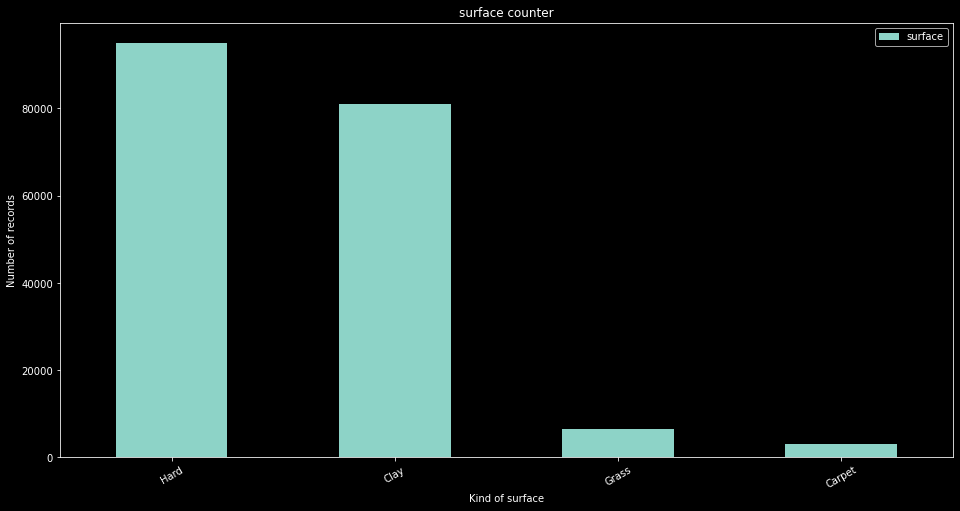

In [53]:
df_matches["surface"].value_counts().plot(
        kind='bar',      # Plot a bar chart
        legend=True,     # Turn the Legend on
        figsize=(16,8),  # Set size of plot in inches
        )

plt.title("surface counter")
plt.xticks(rotation=30, horizontalalignment="center")
plt.xlabel("Kind of surface")
plt.ylabel("Number of records")

plt.savefig("surface_counter.png")

surface_mode = df_matches["surface"].mode()[0]
print("The mode of the surface attribute is:\t" + str(surface_mode) + "\n")

We can easily see a majority of **Hard** value for the attribute.<br>
We fill the missing value with the mode.

In [54]:
df_matches["surface"] = df_matches["surface"].fillna(surface_mode)

Check the surface kind distribution.

In [55]:
n_surface_hard   = df_matches.loc[df_matches["surface"] == "Hard",  "surface"].count()
n_surface_clay   = df_matches.loc[df_matches["surface"] == "Clay",  "surface"].count()
n_surface_grass  = df_matches.loc[df_matches["surface"] == "Grass", "surface"].count()
n_surface_carpet = df_matches.loc[df_matches["surface"] == "Carpet","surface"].count()

print("There are {} ({:.2f} %)\t Hard surface matches".format(n_surface_hard,     n_surface_hard   / (n_surface_hard + n_surface_clay + n_surface_grass + n_surface_carpet) * 100))
print("There are {} ({:.2f} %)\t Clay surface matches".format(n_surface_clay,     n_surface_clay   / (n_surface_hard + n_surface_clay + n_surface_grass + n_surface_carpet) * 100))
print("There are {} ({:.2f} %)\t Grass surface matches".format(n_surface_grass,   n_surface_grass  / (n_surface_hard + n_surface_clay + n_surface_grass + n_surface_carpet) * 100))
print("There are {} ({:.2f} %)\t Carpet surface matches".format(n_surface_carpet, n_surface_carpet / (n_surface_hard + n_surface_clay + n_surface_grass + n_surface_carpet) * 100))

There are 95113 (51.20 %)	 Hard surface matches
There are 81013 (43.61 %)	 Clay surface matches
There are 6600 (3.55 %)	 Grass surface matches
There are 3053 (1.64 %)	 Carpet surface matches


#### **<font color=lime> tourney_level</font>** :  *represents the type of tournament*

We start to observe if the syntax is suitable for the semantic.

In [56]:
df_matches["tourney_level"].unique()

array(['A', 'P', 'G', 'I', 'M', 'PM', 'F', 'D', 'C', '15', '25', '60',
       '100', '80', '10', '50', '75', 'O', 'W', nan], dtype=object)

The syntax is correct, but we got null values, let's count them.

In [57]:
print("We discover\t" + str(df_matches["tourney_level"].isnull().sum()) + "\t null records for the tourney_level attribute")

We discover	6	 null records for the tourney_level attribute


In [58]:
_, df_matches_tourney_level_null = clear_null_records_for_attribute(df_matches, "tourney_level")
df_matches_tourney_level_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186085,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,NaN,NaN,NaN,Luksika Kumkhum,R,NaN,NaN,NaN,NaN,NaN,Ana Bogdan,NaN,NaN,ROU,NaN,2-6 7-6(9) 7-5,NaN,R32,166.0,0.0,10.0,132.0,NaN,56.0,NaN,NaN,10.0,15.0,7.0,NaN,NaN,71.0,NaN,NaN,16.0,7.0,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186090,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,287.0,NaN,NaN,Arantxa Rus,NaN,180.0,NED,NaN,201554.0,NaN,Vitalia Diatchenko,R,NaN,RUS,NaN,1-6 7-5 6-4,NaN,NaN,NaN,NaN,NaN,NaN,52.0,NaN,NaN,14.0,4.0,10.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,NaN,176.0,335.0,NaN,638954.72,Female,Female
186083,2017-1059,Taipei,Hard,32.0,NaN,2017-11-13,NaN,NaN,Q,Priscilla Hon,NaN,NaN,AUS,19.512663,202701.0,NaN,Irina Khromacheva,NaN,NaN,RUS,NaN,6-3 3-6 6-0,NaN,NaN,NaN,5.0,3.0,69.0,NaN,27.0,NaN,NaN,2.0,5.0,6.0,NaN,65.0,NaN,NaN,NaN,NaN,2.0,8.0,231.0,243.0,NaN,365.0,3535.0,NaN,Female,Female
186103,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,300.0,NaN,NaN,Belinda Bencic,NaN,175.0,NaN,20.678987,NaN,NaN,Jil Teichmann,L,NaN,NED,NaN,NaN,NaN,F,75.0,NaN,NaN,50.0,40.0,NaN,6.0,9.0,0.0,1.0,NaN,5.0,77.0,NaN,29.0,12.0,NaN,7.0,NaN,120.0,NaN,167.0,353.0,NaN,NaN,Female,Female
186116,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,NaN,NaN,WC,Ingrid Neel,NaN,NaN,NaN,NaN,203475.0,NaN,Carol Zhao,NaN,NaN,CAN,NaN,6-7(7) 7-6(6) 6-2,NaN,Q1,154.0,7.0,NaN,124.0,84.0,53.0,NaN,NaN,NaN,NaN,NaN,17.0,NaN,NaN,54.0,21.0,16.0,NaN,22.0,704.0,27.0,150.0,NaN,3535.0,638954.72,Female,Female
186099,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,296.0,NaN,NaN,Belinda Bencic,NaN,NaN,SUI,NaN,213525.0,NaN,Jil Teichmann,NaN,NaN,SUI,NaN,6-4 7-5,NaN,NaN,86.0,NaN,NaN,60.0,44.0,NaN,NaN,NaN,NaN,4.0,8.0,3.0,65.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,146.0,NaN,NaN,638954.72,Female,Female


We can observer that the records have the same value for the **tourney_id**, **tourney_date** and the **tourney_name** attribute. <br>
We can check if in the tennis match frame, there is a unique **tourney_level** attribute that have the same **tourney_id**, **tourney_date** and **tourney_name** attribute.

In [59]:
df_matches.loc[(df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13") & (df_matches["tourney_id"] == "2017-1059"), "tourney_level"].unique()

array(['C', nan], dtype=object)

<div class="alert alert-block alert-success"><b>Discoverd knowledge:</b> the <b>Taipei tournament</b>, in <b> date 2017-11-13 </b> with a <b> tourney_id </b> equal to <b> 2017-1059 </b> has <b>C</b> as <b>tourney_level </b>attribute.</div>

Now we can replace this missing information using the new knowledge.

#### **<font color=lime> match_num</font>** : *is a match-specific identifier*

Check if they are missing values

In [60]:
print("We disover\t" + str(df_matches["match_num"].isnull().sum()) + "\t null records for the match_num attribute")

We disover	9	 null records for the match_num attribute


From our analys, as goal to create a *player profile*, the attribute **match_num** it's useless, because it don't give a significant characterization for the player. <br>
Then, we procede to drop the attribute.

In [61]:
df_matches.drop("match_num", axis=1, inplace=True)

#### **<font color=lime> winner_id - loser_id </font>** : *they are unique identifier for winner and loser players*

In [62]:
# Helper functions

def get_winner_player_id(df, name):
    df_winner_name = df[df["winner_name"] == name]
    return df_winner_name["winner_id"].dropna().unique()

def get_loser_player_id(df, name):
    df_loser_name = df[df["loser_name"] == name]
    return df_loser_name["loser_id"].dropna().unique()

def get_player_id(df, name):
    player_id = get_winner_player_id(df, name)
    if player_id.size == 1:
        return player_id[0]
    player_id = get_loser_player_id(df, name)
    if player_id.size == 1:
        return player_id[0]
    return None

Check if we have missing value

In [63]:
print("We discover\t" + str(df_matches["winner_id"].isnull().sum()) + "\t null records for the winner_id attribute")
print("We discover\t" + str(df_matches["loser_id"].isnull().sum())  + "\t null records for the loser_id attribute")

We discover	15	 null records for the winner_id attribute
We discover	7	 null records for the loser_id attribute


Select the null records

In [64]:
_, df_matches_winner_id_null = clear_null_records_for_attribute(df_matches, "winner_id")
_, df_matches_loser_id_null  = clear_null_records_for_attribute(df_matches, "loser_id")

The **winner_id** and the **loser_id** are unique identifier for the players. <br> Using the helper function *get_player_id* we can retrieve, if exist, the missing idientifer for winner and loser players.

In [65]:
sr_winner_name_id_null = df_matches_winner_id_null["winner_name"]

for name in sr_winner_name_id_null:
    df_matches.loc[(df_matches["winner_name"] == name) & (df_matches["winner_id"].isnull()) , "winner_id"] = get_player_id(df_matches, name)

Check if we replace all the null **winner_id** attribute.

In [66]:
df_matches["winner_id"].isnull().sum()

0

Now we apply the same analysis on the **loser_id** attribute.

In [67]:
sr_loser_name_id_null = df_matches_loser_id_null["loser_name"]

for name in sr_loser_name_id_null:
    df_matches.loc[(df_matches["loser_name"] == name) & (df_matches["loser_id"].isnull()) , "loser_id"] = get_player_id(df_matches, name)

Check if we replace all the null **loser_id** attribute.

In [68]:
df_matches["loser_id"].isnull().sum()

0

Finally, we cast the attribute from **Float** into **Integer**.

In [69]:
df_matches.winner_id = df_matches.winner_id.astype(int)
df_matches.loser_id  = df_matches.loser_id.astype(int)

After we clean the core attribute, we can drop all **nested duplicates** record

In [70]:
current_shape = df_matches.shape[0]
df_matches.drop_duplicates(["tourney_name", "tourney_id", "tourney_date", "winner_id", "loser_id"], keep= 'last', inplace = True)

print("Discarded {} ({:.2f} %)\t nested duplicate records from the Matches dataset.".format(current_shape - df_matches.shape[0], (current_shape - df_matches.shape[0]) / n_starting_records_df_matches * 100 ))

Discarded 60 (0.03 %)	 nested duplicate records from the Matches dataset.


#### **<font color=lime> winner_ioc - loser_ioc </font>** : *the country of winner or loser player*, expressed with 3 characters

In [71]:
# Helper functions

def get_winner_ioc(df, winner_id):
    df_winner_id= df[df["winner_id"] == winner_id]
    return df_winner_id["winner_ioc"].dropna().unique()

def get_loser_ioc(df, loser_ioc):
    df_loser_id = df[df["loser_id"] == loser_ioc]
    return df_loser_id["loser_ioc"].dropna().unique()

def get_player_ioc(df, ioc):
    player_ioc = get_winner_ioc(df, ioc)
    if player_ioc.size == 1:
        return player_ioc[0]
    player_ioc = get_loser_ioc(df, ioc)
    if player_ioc.size == 1:
        return player_ioc[0]
    return None

Check if there are missing values

In [72]:
print("We discover\t" + str(df_matches["winner_ioc"].isnull().sum()) + "\t null records for the winner_ioc attribute")
print("We discover\t" + str(df_matches["loser_ioc"].isnull().sum())  + "\t null records for the loser_ioc attribute")

We discover	8	 null records for the winner_ioc attribute
We discover	3	 null records for the loser_ioc attribute


Select the null records

In [73]:
_, df_matches_winner_ioc_null = clear_null_records_for_attribute(df_matches, "winner_ioc")
_, df_matches_loser_ioc_null  = clear_null_records_for_attribute(df_matches, "loser_ioc")

The **winner_id** and the **loser_id** can help us if the player have alredy an ioc in the data frame. <br> Using the helper function *get_player_ioc* we can retrieve, if exist, the missing ioc value for winner and loser players <br>

In [74]:
sr_winner_id_ioc_null = df_matches_winner_ioc_null["winner_id"]

for player_id in sr_winner_id_ioc_null:
    df_matches.loc[(df_matches["winner_id"] == player_id) & (df_matches["winner_ioc"].isnull()) , "winner_ioc"] = get_player_ioc(df_matches, player_id)

Check if we replace all the null **winner_ioc** attribute.

In [75]:
df_matches["winner_ioc"].isnull().sum()

0

Apply the same function to the **loser_ioc** attribute.

In [76]:
sr_loser_id_ioc_null = df_matches_loser_ioc_null["loser_id"]

for player_id in sr_loser_id_ioc_null:
    df_matches.loc[(df_matches["loser_id"] == player_id) & (df_matches["loser_ioc"].isnull()) , "loser_ioc"] = get_player_ioc(df_matches, player_id)

Check if we replace all the null **loser_ioc**

In [77]:
df_matches["loser_ioc"].isnull().sum()

0

Check and impose the syntax correctness of these two attribute.

In [78]:
df_matches["winner_ioc"] = df_matches["winner_ioc"] .str.upper()
df_matches["loser_ioc"]  = df_matches["loser_ioc"] .str.upper()

df_matches.loc[(df_matches["winner_ioc"].str.len() != 3) | (df_matches["loser_ioc"].str.len() != 3)].size == 0

True

#### **<font color=lime> tourney_revenue </font>** : *the revenue in € of the tourney where the match is been played*

Check if there are null values

In [79]:
print("We discover\t" + str(df_matches["tourney_revenue"].isnull().sum()) + "\t null records for the tourney_revenue attribute")

We discover	5	 null records for the tourney_revenue attribute


Select the null records

In [80]:
_, df_matches_tourney_revenue_null = clear_null_records_for_attribute(df_matches, "tourney_revenue")
df_matches_tourney_revenue_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186111,2017-1059,Taipei,Hard,NaN,C,2017-11-13,202614,NaN,Jacqueline Cako,NaN,NaN,USA,NaN,206075,NaN,Hiroko Kuwata,NaN,NaN,JPN,NaN,3-6 6-2 6-3,3.0,NaN,125.0,12.0,NaN,NaN,49.0,NaN,NaN,NaN,7.0,NaN,NaN,3.0,NaN,60.0,NaN,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,3535.0,NaN,Female,Female
186124,2017-1059,Taipei,Hard,32.0,C,2017-11-13,206368,NaN,Veronika Kudermetova,NaN,175.0,RUS,NaN,214562,WC,Ingrid Neel,NaN,NaN,USA,NaN,7-6(3) 6-2,NaN,NaN,71.0,10.0,8.0,63.0,NaN,32.0,NaN,10.0,2.0,5.0,NaN,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,255.0,217.0,704.0,NaN,NaN,NaN,Female,Female
186074,2017-1059,Taipei,Hard,32.0,C,2017-11-13,211878,NaN,Lizette Cabrera,NaN,NaN,AUS,19.901437,201506,NaN,Sara Errani,R,NaN,ITA,30.543463,NaN,NaN,R32,NaN,1.0,NaN,NaN,NaN,35.0,NaN,14.0,7.0,11.0,0.0,NaN,NaN,86.0,NaN,NaN,NaN,7.0,NaN,139.0,NaN,NaN,399.0,NaN,NaN,Female,Female
186084,2017-1059,Taipei,Hard,32.0,C,2017-11-13,202505,NaN,Belinda Bencic,R,NaN,SUI,NaN,202504,NaN,Ying Ying Duan,R,NaN,CHN,NaN,7-6(4) 6-4,3.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,16.0,NaN,NaN,NaN,6.0,2.0,74.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,502.0,93.0,726.0,3535.0,NaN,Female,Female
186083,2017-1059,Taipei,Hard,32.0,NaN,2017-11-13,211880,Q,Priscilla Hon,NaN,NaN,AUS,19.512663,202701,NaN,Irina Khromacheva,NaN,NaN,RUS,NaN,6-3 3-6 6-0,NaN,NaN,NaN,5.0,3.0,69.0,NaN,27.0,NaN,NaN,2.0,5.0,6.0,NaN,65.0,NaN,NaN,NaN,NaN,2.0,8.0,231.0,243.0,NaN,365.0,3535.0,NaN,Female,Female


We can observe how the selected records have the same **tourney_id** (2017-1059), **tourney_name** (Taipei) and **tourney_date** (2017-11-13). <br> As we discovered before, this is a unique triple, then we can check in our dataset if exist a non-null value for the **tourney_revenue** related to this triple.

In [81]:
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13"), "tourney_revenue"].dropna().unique()

array([638954.72])

Now we can replace the missing information, with the discovered value

In [82]:
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13"), "tourney_revenue"] = 638954.72

<AxesSubplot:>

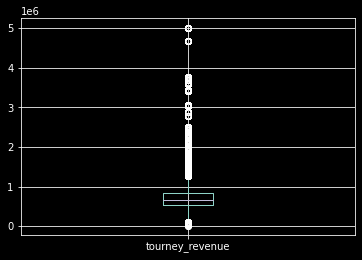

In [83]:
df_matches.boxplot(column=["tourney_revenue"])

#### **<font color=lime> tourney_spectators </font>** : *the spectators of the tourney where the match is been played*

Check if there are null values

In [84]:
print("We discover\t" + str(df_matches["tourney_spectators"].isnull().sum()) + "\t null records for the tourney_spectators attribute")

We discover	6	 null records for the tourney_spectators attribute


Select the null records

In [85]:
_, df_matches_tourney_spectators_null = clear_null_records_for_attribute(df_matches, "tourney_spectators")
df_matches_tourney_spectators_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186090,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,201551,NaN,Arantxa Rus,NaN,180.0,NED,NaN,201554,NaN,Vitalia Diatchenko,R,NaN,RUS,NaN,1-6 7-5 6-4,NaN,NaN,NaN,NaN,NaN,NaN,52.0,NaN,NaN,14.0,4.0,10.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,NaN,176.0,335.0,NaN,638954.72,Female,Female
186122,2017-1059,Taipei,Hard,32.0,C,2017-11-13,211880,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,212026,WC,Kwan Yau Ng,NaN,NaN,HKG,NaN,NaN,NaN,Q1,NaN,3.0,4.0,59.0,NaN,23.0,NaN,9.0,NaN,NaN,7.0,4.0,58.0,31.0,21.0,NaN,8.0,8.0,NaN,NaN,NaN,NaN,8.0,NaN,638954.72,Female,Female
186124,2017-1059,Taipei,Hard,32.0,C,2017-11-13,206368,NaN,Veronika Kudermetova,NaN,175.0,RUS,NaN,214562,WC,Ingrid Neel,NaN,NaN,USA,NaN,7-6(3) 6-2,NaN,NaN,71.0,10.0,8.0,63.0,NaN,32.0,NaN,10.0,2.0,5.0,NaN,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,255.0,217.0,704.0,NaN,NaN,638954.72,Female,Female
186074,2017-1059,Taipei,Hard,32.0,C,2017-11-13,211878,NaN,Lizette Cabrera,NaN,NaN,AUS,19.901437,201506,NaN,Sara Errani,R,NaN,ITA,30.543463,NaN,NaN,R32,NaN,1.0,NaN,NaN,NaN,35.0,NaN,14.0,7.0,11.0,0.0,NaN,NaN,86.0,NaN,NaN,NaN,7.0,NaN,139.0,NaN,NaN,399.0,NaN,638954.72,Female,Female
186118,2017-1059,Taipei,Hard,NaN,C,2017-11-13,203435,NaN,Dalila Jakupovic,NaN,NaN,SLO,NaN,211874,NaN,Victoria Rodriguez,NaN,NaN,MEX,NaN,6-2 6-3,3.0,Q1,NaN,0.0,NaN,46.0,NaN,19.0,NaN,NaN,2.0,NaN,NaN,3.0,60.0,42.0,19.0,NaN,8.0,NaN,11.0,NaN,228.0,NaN,204.0,NaN,638954.72,Female,Female
186099,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,202505,NaN,Belinda Bencic,NaN,NaN,SUI,NaN,213525,NaN,Jil Teichmann,NaN,NaN,SUI,NaN,6-4 7-5,NaN,NaN,86.0,NaN,NaN,60.0,44.0,NaN,NaN,NaN,NaN,4.0,8.0,3.0,65.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,146.0,NaN,NaN,638954.72,Female,Female


We can observe how the selected records have the same **tourney_id** (2017-1059), **tourney_name** (Taipei) and **tourney_date** (2017-11-13). <br> As we discovered before, this is a unique triple, then we can check in our dataset if exist a non-null value for the **tourney_spectators** related to this triple.

In [86]:
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13"), "tourney_spectators"].dropna().unique()

array([3535.])

Now we can replace the missing information, with the discovered value

In [87]:
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["tourney_name"] == "Taipei") & (df_matches["tourney_date"] == "2017-11-13"), "tourney_spectators"] = 3535

<AxesSubplot:>

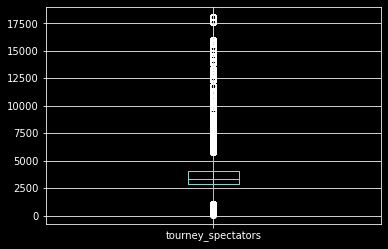

In [88]:
df_matches.boxplot(column=["tourney_spectators"])

#### **<font color=lime> draw_size</font>** :  *represents the number of players in the tourney*

In [89]:
#helper function

def update_next_power_of_2(x):
    power = 1;
    while(power < x):
        power = power * 2
    return power

Check if there are null values.

In [90]:
print("We discover\t" + str(df_matches["draw_size"].isnull().sum()) + "\t null records for the draw_size attribute")

We discover	8	 null records for the draw_size attribute


Select the null values

In [91]:
_, df_matches_draw_size_null = clear_null_records_for_attribute(df_matches, "draw_size")
df_matches_draw_size_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186085,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,202503,NaN,Luksika Kumkhum,R,NaN,THA,NaN,202536,NaN,Ana Bogdan,NaN,NaN,ROU,NaN,2-6 7-6(9) 7-5,NaN,R32,166.0,0.0,10.0,132.0,NaN,56.0,NaN,NaN,10.0,15.0,7.0,NaN,NaN,71.0,NaN,NaN,16.0,7.0,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186090,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,201551,NaN,Arantxa Rus,NaN,180.0,NED,NaN,201554,NaN,Vitalia Diatchenko,R,NaN,RUS,NaN,1-6 7-5 6-4,NaN,NaN,NaN,NaN,NaN,NaN,52.0,NaN,NaN,14.0,4.0,10.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,NaN,176.0,335.0,3535.0,638954.72,Female,Female
186100,2017-1059,Taipei,Hard,NaN,C,2017-11-13,203530,NaN,Viktorija Golubic,R,NaN,SUI,25.075975,202503,NaN,Luksika Kumkhum,R,NaN,THA,NaN,NaN,3.0,NaN,NaN,3.0,4.0,NaN,NaN,41.0,22.0,NaN,NaN,NaN,1.0,7.0,NaN,NaN,35.0,17.0,15.0,5.0,10.0,NaN,NaN,NaN,486.0,3535.0,638954.72,Female,Female
186111,2017-1059,Taipei,Hard,NaN,C,2017-11-13,202614,NaN,Jacqueline Cako,NaN,NaN,USA,NaN,206075,NaN,Hiroko Kuwata,NaN,NaN,JPN,NaN,3-6 6-2 6-3,3.0,NaN,125.0,12.0,NaN,NaN,49.0,NaN,NaN,NaN,7.0,NaN,NaN,3.0,NaN,60.0,NaN,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186095,2017-1059,Taipei,Hard,NaN,C,2017-11-13,202503,NaN,Luksika Kumkhum,NaN,NaN,THA,NaN,213631,NaN,Marie Bouzkova,NaN,NaN,CZE,19.315537,6-4 6-3,NaN,NaN,NaN,NaN,NaN,NaN,44.0,30.0,NaN,10.0,NaN,NaN,NaN,2.0,57.0,NaN,21.0,9.0,9.0,6.0,NaN,NaN,NaN,182.0,NaN,3535.0,638954.72,Female,Female
186118,2017-1059,Taipei,Hard,NaN,C,2017-11-13,203435,NaN,Dalila Jakupovic,NaN,NaN,SLO,NaN,211874,NaN,Victoria Rodriguez,NaN,NaN,MEX,NaN,6-2 6-3,3.0,Q1,NaN,0.0,NaN,46.0,NaN,19.0,NaN,NaN,2.0,NaN,NaN,3.0,60.0,42.0,19.0,NaN,8.0,NaN,11.0,NaN,228.0,NaN,204.0,3535.0,638954.72,Female,Female
186116,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,214562,WC,Ingrid Neel,NaN,NaN,USA,NaN,203475,NaN,Carol Zhao,NaN,NaN,CAN,NaN,6-7(7) 7-6(6) 6-2,NaN,Q1,154.0,7.0,NaN,124.0,84.0,53.0,NaN,NaN,NaN,NaN,NaN,17.0,NaN,NaN,54.0,21.0,16.0,NaN,22.0,704.0,27.0,150.0,NaN,3535.0,638954.72,Female,Female
186099,2017-1059,Taipei,Hard,NaN,NaN,2017-11-13,202505,NaN,Belinda Bencic,NaN,NaN,SUI,NaN,213525,NaN,Jil Teichmann,NaN,NaN,SUI,NaN,6-4 7-5,NaN,NaN,86.0,NaN,NaN,60.0,44.0,NaN,NaN,NaN,NaN,4.0,8.0,3.0,65.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,146.0,NaN,3535.0,638954.72,Female,Female


We can observer how all the null values have the same **tourney_id**, then we can check if exist a not null value for the **draw_size** attribute corresponding to the same **tourney_id.**

In [92]:
df_matches.loc[(df_matches["draw_size"].notna()) & (df_matches["tourney_id"] == "2017-1059"), "draw_size"].unique()

array([32.])

Now we can replace the missing information, with the discovered value

In [93]:
df_matches.loc[(df_matches["draw_size"].isnull()) & (df_matches["tourney_id"] == "2017-1059"), "draw_size"] = 32

Check the semantic correctness of the attribute

In [94]:
df_matches["draw_size"].sort_values().unique()

array([  2.,   4.,   8.,  10.,  12.,  15.,  16.,  18.,  19.,  20.,  23.,
        24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  48.,  54.,
        64., 128.])

We are going to update each value of the **draw_size** attribute to the next power of **2** in according to the semantic.

In [95]:
df_matches.loc[:, "draw_size"] = df_matches.loc[:,"draw_size"].apply(lambda x: update_next_power_of_2(x))

In [96]:
df_matches["draw_size"].sort_values().unique()

array([  2,   4,   8,  16,  32,  64, 128], dtype=int64)

#### **<font color=lime> round </font>** : *it describe the round of the match in the tourney*

Check if we have null values

In [97]:
print("We discover\t" + str(df_matches["round"].isnull().sum()) + "\t null records for the round attribute")

We discover	9	 null records for the round attribute


Select the null values

In [98]:
_, df_matches_round_null = clear_null_records_for_attribute(df_matches, "round")
df_matches_round_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186090,2017-1059,Taipei,Hard,32,NaN,2017-11-13,201551,NaN,Arantxa Rus,NaN,180.0,NED,NaN,201554,NaN,Vitalia Diatchenko,R,NaN,RUS,NaN,1-6 7-5 6-4,NaN,NaN,NaN,NaN,NaN,NaN,52.0,NaN,NaN,14.0,4.0,10.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,NaN,176.0,335.0,3535.0,638954.72,Female,Female
186100,2017-1059,Taipei,Hard,32,C,2017-11-13,203530,NaN,Viktorija Golubic,R,NaN,SUI,25.075975,202503,NaN,Luksika Kumkhum,R,NaN,THA,NaN,NaN,3.0,NaN,NaN,3.0,4.0,NaN,NaN,41.0,22.0,NaN,NaN,NaN,1.0,7.0,NaN,NaN,35.0,17.0,15.0,5.0,10.0,NaN,NaN,NaN,486.0,3535.0,638954.72,Female,Female
186111,2017-1059,Taipei,Hard,32,C,2017-11-13,202614,NaN,Jacqueline Cako,NaN,NaN,USA,NaN,206075,NaN,Hiroko Kuwata,NaN,NaN,JPN,NaN,3-6 6-2 6-3,3.0,NaN,125.0,12.0,NaN,NaN,49.0,NaN,NaN,NaN,7.0,NaN,NaN,3.0,NaN,60.0,NaN,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186124,2017-1059,Taipei,Hard,32,C,2017-11-13,206368,NaN,Veronika Kudermetova,NaN,175.0,RUS,NaN,214562,WC,Ingrid Neel,NaN,NaN,USA,NaN,7-6(3) 6-2,NaN,NaN,71.0,10.0,8.0,63.0,NaN,32.0,NaN,10.0,2.0,5.0,NaN,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,255.0,217.0,704.0,NaN,3535.0,638954.72,Female,Female
186084,2017-1059,Taipei,Hard,32,C,2017-11-13,202505,NaN,Belinda Bencic,R,NaN,SUI,NaN,202504,NaN,Ying Ying Duan,R,NaN,CHN,NaN,7-6(4) 6-4,3.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,16.0,NaN,NaN,NaN,6.0,2.0,74.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,502.0,93.0,726.0,3535.0,638954.72,Female,Female
186095,2017-1059,Taipei,Hard,32,C,2017-11-13,202503,NaN,Luksika Kumkhum,NaN,NaN,THA,NaN,213631,NaN,Marie Bouzkova,NaN,NaN,CZE,19.315537,6-4 6-3,NaN,NaN,NaN,NaN,NaN,NaN,44.0,30.0,NaN,10.0,NaN,NaN,NaN,2.0,57.0,NaN,21.0,9.0,9.0,6.0,NaN,NaN,NaN,182.0,NaN,3535.0,638954.72,Female,Female
186083,2017-1059,Taipei,Hard,32,NaN,2017-11-13,211880,Q,Priscilla Hon,NaN,NaN,AUS,19.512663,202701,NaN,Irina Khromacheva,NaN,NaN,RUS,NaN,6-3 3-6 6-0,NaN,NaN,NaN,5.0,3.0,69.0,NaN,27.0,NaN,NaN,2.0,5.0,6.0,NaN,65.0,NaN,NaN,NaN,NaN,2.0,8.0,231.0,243.0,NaN,365.0,3535.0,638954.72,Female,Female
186127,2017-1059,Taipei,Hard,32,C,2017-11-13,211880,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,202614,NaN,Jacqueline Cako,NaN,NaN,USA,NaN,6-4 6-4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,8.0,NaN,NaN,43.0,25.0,9.0,10.0,4.0,8.0,NaN,NaN,181.0,322.0,3535.0,638954.72,Female,Female
186099,2017-1059,Taipei,Hard,32,NaN,2017-11-13,202505,NaN,Belinda Bencic,NaN,NaN,SUI,NaN,213525,NaN,Jil Teichmann,NaN,NaN,SUI,NaN,6-4 7-5,NaN,NaN,86.0,NaN,NaN,60.0,44.0,NaN,NaN,NaN,NaN,4.0,8.0,3.0,65.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,146.0,NaN,3535.0,638954.72,Female,Female


We cannot extract from the dataset a exact information, then we use again a <font color=red> data driven </font> because we have few missing values. <br>
In order we discovered:

For the record ID 186090 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS014 where the round is R16 <br>
For the record ID 186100 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS004 where the round is QF  <br>
For the record ID 186111 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/RS008 where the round is Q1 <br>
For the record ID 186124 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/RS007 where the round is Q2 <br>
For the record ID 186084 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS020 where the round is R32 <br>
For the record ID 186095 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS009 where the round is R16 <br>
For the record ID 186083 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS021 where the round is R32 <br>
For the record ID 186127 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/RS004 where the round is Q2 <br>
For the record ID 186099 we have retrieved the match: https://www.wtatennis.com/tournament/1059/taipei/2017/scores/LS005 where the round is QF <br>

Now we update, in order, the view with those new informations

In [99]:
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 201551) & (df_matches["loser_id"] == 201554), "round"] = "R16"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 203530) & (df_matches["loser_id"] == 202503), "round"] = "QF"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 202614) & (df_matches["loser_id"] == 206075), "round"] = "Q1"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 206368) & (df_matches["loser_id"] == 214562), "round"] = "Q2"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 202505) & (df_matches["loser_id"] == 202504), "round"] = "R32"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 202503) & (df_matches["loser_id"] == 213631), "round"] = "R16"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 211880) & (df_matches["loser_id"] == 202701), "round"] = "R32"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 211880) & (df_matches["loser_id"] == 202614), "round"] = "Q2"
df_matches.loc[(df_matches["tourney_id"] == "2017-1059") & (df_matches["winner_id"] == 202505) & (df_matches["loser_id"] == 213525), "round"] = "QF"

We check if the syntax is correct

In [100]:
df_matches["round"].unique()

array(['F', 'SF', 'QF', 'R16', 'R32', 'Q1', 'Q2', 'Q3', 'R64', 'R128',
       'RR', 'BR'], dtype=object)

We analyze the **round** distribution in the Tennis Matches dataset

In [101]:
n_round_F    = df_matches.loc[df_matches["round"] == "F",    "round"].count()
n_round_SF   = df_matches.loc[df_matches["round"] == "SF",   "round"].count()
n_round_QF   = df_matches.loc[df_matches["round"] == "QF",   "round"].count()
n_round_R16  = df_matches.loc[df_matches["round"] == "R16",  "round"].count()
n_round_R32  = df_matches.loc[df_matches["round"] == "R32",  "round"].count()
n_round_R64  = df_matches.loc[df_matches["round"] == "R64",  "round"].count()
n_round_R128 = df_matches.loc[df_matches["round"] == "R128", "round"].count()
n_round_Q1   = df_matches.loc[df_matches["round"] == "Q1",   "round"].count()
n_round_Q2   = df_matches.loc[df_matches["round"] == "Q2",   "round"].count()
n_round_RR   = df_matches.loc[df_matches["round"] == "RR",   "round"].count()
n_round_BR   = df_matches.loc[df_matches["round"] == "BR",   "round"].count()

tot_round = n_round_F + n_round_SF + n_round_QF + n_round_R16 + n_round_R32 + n_round_R64 + n_round_R128 + n_round_Q1 + n_round_Q2 + n_round_RR + n_round_BR

print("There are {} ({:.2f} %)\t F round in the matches".format(n_round_F,       n_round_F    / tot_round * 100))
print("There are {} ({:.2f} %)\t SF round in the matches".format(n_round_SF,     n_round_SF   / tot_round * 100))
print("There are {} ({:.2f} %)\t QF round in the matches".format(n_round_QF,     n_round_QF   / tot_round * 100))
print("There are {} ({:.2f} %)\t R16 round in the matches".format(n_round_R16,   n_round_R16  / tot_round * 100))
print("There are {} ({:.2f} %)\t R32 round in the matches".format(n_round_R32,   n_round_R32  / tot_round * 100))
print("There are {} ({:.2f} %)\t R64 round in the matches".format(n_round_R64,   n_round_R64  / tot_round * 100))
print("There are {} ({:.2f} %)\t R128 round in the matches".format(n_round_R128, n_round_R128 / tot_round * 100))
print("There are {} ({:.2f} %)\t Q1 round in the matches".format(n_round_Q1,     n_round_Q1   / tot_round * 100))
print("There are {} ({:.2f} %)\t Q2 round in the matches".format(n_round_Q2,     n_round_Q2   / tot_round * 100))
print("There are {} ({:.2f} %)\t RR round in the matches".format(n_round_RR,     n_round_RR   / tot_round * 100))
print("There are {} ({:.2f} %)\t BR round in the matches".format(n_round_BR,     n_round_BR   / tot_round * 100))

There are 4003 (2.21 %)	 F round in the matches
There are 8028 (4.43 %)	 SF round in the matches
There are 15998 (8.83 %)	 QF round in the matches
There are 32098 (17.71 %)	 R16 round in the matches
There are 63047 (34.78 %)	 R32 round in the matches
There are 7707 (4.25 %)	 R64 round in the matches
There are 3453 (1.91 %)	 R128 round in the matches
There are 27508 (15.18 %)	 Q1 round in the matches
There are 16778 (9.26 %)	 Q2 round in the matches
There are 2624 (1.45 %)	 RR round in the matches
There are 5 (0.00 %)	 BR round in the matches


#### **<font color=lime> best_of </font>** : *it indicate the number of set for this match*

Check if we have null values

In [102]:
print("We discover\t" + str(df_matches["best_of"].isnull().sum()) + "\t null records for the best_of attribute")

We discover	10	 null records for the best_of attribute


Select the null values

In [103]:
_, df_matches_best_of_null = clear_null_records_for_attribute(df_matches, "best_of")
df_matches_best_of_null

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,tourney_spectators,tourney_revenue,winner_sex,loser_sex
186085,2017-1059,Taipei,Hard,32,NaN,2017-11-13,202503,NaN,Luksika Kumkhum,R,NaN,THA,NaN,202536,NaN,Ana Bogdan,NaN,NaN,ROU,NaN,2-6 7-6(9) 7-5,NaN,R32,166.0,0.0,10.0,132.0,NaN,56.0,NaN,NaN,10.0,15.0,7.0,NaN,NaN,71.0,NaN,NaN,16.0,7.0,NaN,NaN,NaN,NaN,NaN,3535.0,638954.72,Female,Female
186090,2017-1059,Taipei,Hard,32,NaN,2017-11-13,201551,NaN,Arantxa Rus,NaN,180.0,NED,NaN,201554,NaN,Vitalia Diatchenko,R,NaN,RUS,NaN,1-6 7-5 6-4,NaN,R16,NaN,NaN,NaN,NaN,52.0,NaN,NaN,14.0,4.0,10.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,NaN,176.0,335.0,3535.0,638954.72,Female,Female
186122,2017-1059,Taipei,Hard,32,C,2017-11-13,211880,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,212026,WC,Kwan Yau Ng,NaN,NaN,HKG,NaN,NaN,NaN,Q1,NaN,3.0,4.0,59.0,NaN,23.0,NaN,9.0,NaN,NaN,7.0,4.0,58.0,31.0,21.0,NaN,8.0,8.0,NaN,NaN,NaN,NaN,8.0,3535.0,638954.72,Female,Female
186124,2017-1059,Taipei,Hard,32,C,2017-11-13,206368,NaN,Veronika Kudermetova,NaN,175.0,RUS,NaN,214562,WC,Ingrid Neel,NaN,NaN,USA,NaN,7-6(3) 6-2,NaN,Q2,71.0,10.0,8.0,63.0,NaN,32.0,NaN,10.0,2.0,5.0,NaN,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,255.0,217.0,704.0,NaN,3535.0,638954.72,Female,Female
186074,2017-1059,Taipei,Hard,32,C,2017-11-13,211878,NaN,Lizette Cabrera,NaN,NaN,AUS,19.901437,201506,NaN,Sara Errani,R,NaN,ITA,30.543463,NaN,NaN,R32,NaN,1.0,NaN,NaN,NaN,35.0,NaN,14.0,7.0,11.0,0.0,NaN,NaN,86.0,NaN,NaN,NaN,7.0,NaN,139.0,NaN,NaN,399.0,3535.0,638954.72,Female,Female
186095,2017-1059,Taipei,Hard,32,C,2017-11-13,202503,NaN,Luksika Kumkhum,NaN,NaN,THA,NaN,213631,NaN,Marie Bouzkova,NaN,NaN,CZE,19.315537,6-4 6-3,NaN,R16,NaN,NaN,NaN,NaN,44.0,30.0,NaN,10.0,NaN,NaN,NaN,2.0,57.0,NaN,21.0,9.0,9.0,6.0,NaN,NaN,NaN,182.0,NaN,3535.0,638954.72,Female,Female
186083,2017-1059,Taipei,Hard,32,NaN,2017-11-13,211880,Q,Priscilla Hon,NaN,NaN,AUS,19.512663,202701,NaN,Irina Khromacheva,NaN,NaN,RUS,NaN,6-3 3-6 6-0,NaN,R32,NaN,5.0,3.0,69.0,NaN,27.0,NaN,NaN,2.0,5.0,6.0,NaN,65.0,NaN,NaN,NaN,NaN,2.0,8.0,231.0,243.0,NaN,365.0,3535.0,638954.72,Female,Female
186116,2017-1059,Taipei,Hard,32,NaN,2017-11-13,214562,WC,Ingrid Neel,NaN,NaN,USA,NaN,203475,NaN,Carol Zhao,NaN,NaN,CAN,NaN,6-7(7) 7-6(6) 6-2,NaN,Q1,154.0,7.0,NaN,124.0,84.0,53.0,NaN,NaN,NaN,NaN,NaN,17.0,NaN,NaN,54.0,21.0,16.0,NaN,22.0,704.0,27.0,150.0,NaN,3535.0,638954.72,Female,Female
186127,2017-1059,Taipei,Hard,32,C,2017-11-13,211880,NaN,Priscilla Hon,NaN,NaN,AUS,19.512663,202614,NaN,Jacqueline Cako,NaN,NaN,USA,NaN,6-4 6-4,NaN,Q2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,8.0,NaN,NaN,43.0,25.0,9.0,10.0,4.0,8.0,NaN,NaN,181.0,322.0,3535.0,638954.72,Female,Female
186099,2017-1059,Taipei,Hard,32,NaN,2017-11-13,202505,NaN,Belinda Bencic,NaN,NaN,SUI,NaN,213525,NaN,Jil Teichmann,NaN,NaN,SUI,NaN,6-4 7-5,NaN,QF,86.0,NaN,NaN,60.0,44.0,NaN,NaN,NaN,NaN,4.0,8.0,3.0,65.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,146.0,NaN,3535.0,638954.72,Female,Female


All null values have the same **tourney_id** attribute then, because the **best_of** attribute is correlated to the tournament, then we can retrieve the missing information

In [104]:
df_matches.loc[(df_matches["best_of"].notna()) & (df_matches["tourney_id"] == "2017-1059"), "best_of"].unique()

array([3.])

Now we can replace the missing information, with the discovered value

In [105]:
df_matches.loc[(df_matches["best_of"].isnull()) & (df_matches["tourney_id"] == "2017-1059"), "best_of"] = 3

We check if the syntax is correct

In [106]:
df_matches["best_of"].unique()

array([3., 5.])

We analyze the **best_of** distrubtion in the Tennis Match dataset.

There are 182546 (98.29 %)	 3 best_of matches
There are 3173 (1.71 %)	 5 best_of matches


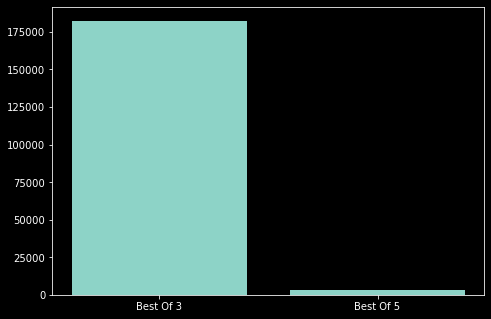

In [107]:
n_best_of_3 = df_matches.loc[df_matches["best_of"] == 3, "best_of"].count()
n_best_of_5 = df_matches.loc[df_matches["best_of"] == 5, "best_of"].count()

print("There are {} ({:.2f} %)\t 3 best_of matches".format(n_best_of_3, n_best_of_3 / (n_best_of_3 + n_best_of_5) * 100))
print("There are {} ({:.2f} %)\t 5 best_of matches".format(n_best_of_5, n_best_of_5 / (n_best_of_3 + n_best_of_5) * 100))

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
best_of = ["Best Of 3", "Best Of 5"]
best_of_played = [n_best_of_3, n_best_of_5]
ax.bar(best_of, best_of_played)
plt.show()

The best of **5** matches games are really low respected to the the best of **3** games, and we suppose that a matches played in **5** games can lead to different stats respect a match played in **3** games. <br>
Ffor this reason we discard all matches that are best of 5. 

In [108]:
df_matches.drop(df_matches[df_matches.best_of == 5].index, inplace=True)

Since we just have best of 3 games, we drop the attribute.

In [109]:
df_matches.drop("best_of", axis=1, inplace=True)

#### **<font color=lime> winner_hand - loser_hand </font>** : *the hand of the winner or loser player in the match*

In [110]:
# Helper functions

def get_winner_hand(df, winner_id):
    return df.loc[df["winner_id"] == winner_id, "winner_hand"].dropna().unique()

def get_loser_hand(df, loser_id):
    return df.loc[df["loser_id"] == loser_id, "loser_hand"].dropna().unique()

def get_player_hand(df, player_id):
    player_hand = get_winner_hand(df, player_id)
    if player_hand.size == 1:
        return player_hand[0]
    player_hand = get_loser_hand(df, player_id)
    if player_hand.size == 1:
        return player_hand[0]
    return None

Check if we have null values

In [111]:
print("We discover\t" + str(df_matches["winner_hand"].isnull().sum()) + "\t null records for the winner_hand attribute")
print("We discover\t" + str(df_matches["loser_hand"].isnull().sum())  + "\t null records for the loser_hand attribute")

We discover	27	 null records for the winner_hand attribute
We discover	75	 null records for the loser_hand attribute


Select the null records

In [112]:
_, df_matches_winner_hand_null = clear_null_records_for_attribute(df_matches, "winner_hand")
_, df_matches_loser_hand_null  = clear_null_records_for_attribute(df_matches, "loser_hand")

The **winner_id** and the **loser_id** can help us if the player have been played any match in the data set; if so, we can know the correct player hand.
<br> Using the helper function *get_player_hand* we can retrieve, if exist, the missing hand value for winner and loser players <br>

In [113]:
sr_winner_id_hand_null = df_matches_winner_hand_null["winner_id"]

for player_id in sr_winner_id_hand_null:
    df_matches.loc[(df_matches["winner_id"] == player_id) & (df_matches["winner_hand"].isnull()) , "winner_hand"] = get_player_hand(df_matches, player_id)

Check if we replace all the null **winner_hand** attribute.

In [114]:
df_matches["winner_hand"].isnull().sum()

16

Because we can't retrieve the **winner_hand** using other attributes, then we assing the value "U" (Unknow) for the remaining values.

In [115]:
df_matches.loc[(df_matches["winner_hand"].isnull()), "winner_hand"] = "U"

Check the syntax correctness of attribute.

In [116]:
df_matches["winner_hand"].unique()

array(['R', 'L', 'U'], dtype=object)

Apply the same idea to the other attribute.

In [117]:
sr_loser_id_hand_null = df_matches_loser_hand_null["loser_id"]

for player_id in sr_loser_id_hand_null:
    df_matches.loc[(df_matches["loser_id"] == player_id) & (df_matches["loser_hand"].isnull()) , "loser_hand"] = get_player_hand(df_matches, player_id)

Check if we replace all the null **loser_hand** attribute.

In [118]:
df_matches["loser_hand"].isnull().sum()

38

Because we can't retrieve the **loser_hand** using other attributes, then we assing the value "U" (Unknow) for the remaining values.

In [119]:
df_matches.loc[(df_matches["loser_hand"].isnull()), "loser_hand"] = "U"

Check the syntax correctness of attribute.

In [120]:
df_matches["loser_hand"].unique()

array(['R', 'L', 'U'], dtype=object)

#### **<font color=lime> score </font>** : *the score of the match*

We create a new numberical (binray) attibute called **tie-break** that is equal to **1** if the winner player won the match with a tie-break point, else is equal to **0**.

In [121]:
df_matches["tie-break"] = np.where(df_matches["score"].str.contains("\("), 1, 0)

Check if we have null values

In [122]:
print("We discover\t" + str(df_matches["score"].isnull().sum()) + "\t null records for the score attribute")

We discover	170	 null records for the score attribute


As goal to create a profile, we think the attribute score don't give any significant information, then we are going to drop it.

In [123]:
df_matches.drop("score", axis=1, inplace=True)

#### **<font color=lime> tie-break </font>** : *indicate if the player won with a tie-break point*

Check if we have null values

In [124]:
print("We discover\t" + str(df_matches["tie-break"].isnull().sum()) + "\t null records for the score attribute")

We discover	0	 null records for the score attribute


#### **<font color=lime> winner_age - loser_age </font>** : *the age of winner or loser player*

In [125]:
# Helper functions

def get_winner_age(df, winner_id):
    df_winner_id = df[df["winner_id"] == winner_id]
    return df_winner_id["winner_age"].dropna().mean()

def get_loser_age(df, loser_id):
    df_loser_id = df[df["loser_id"] == loser_id]
    return df_loser_id["loser_age"].dropna().mean()

def get_player_age_mean(df, player_id):
    player_age = get_winner_age(df, player_id)
    if player_age is not None:
        return player_age
    player_age = get_loser_age(df, player_id)
    if player_age is not None:
        return player_age
    return None

Check if there are missing values

In [126]:
print("We discover\t" + str(df_matches["winner_age"].isnull().sum()) + "\t null records for the winner_age attribute")
print("We discover\t" + str(df_matches["loser_age"].isnull().sum())  + "\t null records for the loser_age attribute")

We discover	2835	 null records for the winner_age attribute
We discover	6511	 null records for the loser_age attribute


Select the null records

In [127]:
df_matches_winner_age_not_null, df_matches_winner_age_null = clear_null_records_for_attribute(df_matches, "winner_age")
df_matches_loser_age_not_null,  df_matches_loser_age_null  = clear_null_records_for_attribute(df_matches, "loser_age")

We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [128]:
winner_age_male_left_bound,   winner_age_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "winner_age", 2)
winner_age_female_left_bound, winner_age_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "winner_age", 2)

loser_age_male_left_bound,    loser_age_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "loser_age", 2)
loser_age_female_left_bound,  loser_age_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "loser_age", 2)

We replace the detected outlier with the mean of the attribute

In [129]:
df_matches.loc[((df_matches["winner_age"] < float(winner_age_male_left_bound) )   | (df_matches["winner_age"] > float(winner_age_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "winner_age"] = df_matches.loc[((df_matches["winner_age"] > float(winner_age_male_left_bound) )   | (df_matches["winner_age"] < float(winner_age_male_right_bound)) & (df_matches["winner_sex"] == "Male")), "winner_age"].mean()
df_matches.loc[((df_matches["winner_age"] < float(winner_age_female_left_bound) ) | (df_matches["winner_age"] > float(winner_age_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "winner_age"] = df_matches.loc[((df_matches["winner_age"] > float(winner_age_female_left_bound) ) | (df_matches["winner_age"] < float(winner_age_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "winner_age"].mean()

df_matches.loc[((df_matches["loser_age"] < float(loser_age_male_left_bound) )   | (df_matches["loser_age"] > float(loser_age_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "loser_age"] = df_matches.loc[((df_matches["loser_age"] > float(loser_age_male_left_bound) )   | (df_matches["loser_age"] < float(loser_age_male_right_bound)) & (df_matches["loser_sex"] == "Male")), "loser_age"].mean()
df_matches.loc[((df_matches["loser_age"] < float(loser_age_female_left_bound) ) | (df_matches["loser_age"] > float(loser_age_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "loser_age"] = df_matches.loc[((df_matches["loser_age"] > float(loser_age_female_left_bound) ) | (df_matches["loser_age"] < float(loser_age_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "loser_age"].mean()

The **winner_id** and the **loser_id** can help us if the player have alredy an **age** in the data frame. <br> Using the helper function *get_player_age* we can retrieve, if exist, the missing age value for winner and loser players <br>

In [130]:
sr_winner_id_age_null    = df_matches_winner_age_null["winner_id"]

for player_id in sr_winner_id_age_null:
    df_matches.loc[(df_matches["winner_id"] == player_id) & (df_matches["winner_age"].isnull()) , "winner_age"] = get_player_age_mean(df_matches, player_id)

Check if we replace all the null **winner_ioc**

In [131]:
df_matches["winner_age"].isnull().sum()

2824

For the remains missing value, we can fill with the mean 

In [132]:
winner_age_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "winner_age"].mean()
winner_age_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "winner_age"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["winner_age"].isnull()), "winner_age"] = winner_age_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["winner_age"].isnull()), "winner_age"] = winner_age_female_mean

Apply the same function to the <font color=green> **loser_age** </font> attribute

In [133]:
sr_loser_id_age_null = df_matches_loser_age_null["loser_id"]

for player_id in sr_loser_id_age_null:
    df_matches.loc[(df_matches["loser_id"] == player_id) & (df_matches["loser_age"].isnull()), "loser_age"] = get_player_age_mean(df_matches, player_id)

Check if we replace all the null **loser_age** attribute.

In [134]:
df_matches["loser_age"].isnull().sum()

2051

For the remains missing value, we can fill with the mean 

In [135]:
loser_age_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "loser_age"].mean()
loser_age_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "loser_age"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["loser_age"].isnull()), "loser_age"] = loser_age_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["loser_age"].isnull()), "loser_age"] = loser_age_female_mean

Finally, we cast the attribute from **Float** into **Integer**.

In [136]:
df_matches.loc[:,"winner_age"] = df_matches.loc[:,"winner_age"].astype(int)
df_matches.loc[:,"loser_age"]  = df_matches.loc[:,"loser_age"].astype(int)

#### **<font color=lime> winner_rank - loser_rank </font>**: *describes the winner or loser player's ATP or WTA rank*

In [137]:
# Helper functions

def get_winner_rank(df, winner_id):
    return df.loc[df["winner_id"] == winner_id, "winner_rank"].dropna().mean()

def get_loser_rank(df, loser_id):
    return df.loc[df["loser_id"] == loser_id, "loser_rank"].dropna().mean()

def get_player_rank_mean(df, player_id):
    player_rank = get_winner_rank(df, player_id)
    if player_rank is not None:
        return player_rank
    player_rank = get_loser_rank(df, player_id)
    if player_rank is not None:
        return player_rank
    return None

Check for null values

In [138]:
print("We discover\t" + str(df_matches["winner_rank"].isnull().sum()) + "\t null records for the winner_rank attribute")
print("We discover\t" + str(df_matches["loser_rank"].isnull().sum())  + "\t null records for the loser_rank attribute")

We discover	19359	 null records for the winner_rank attribute
We discover	35199	 null records for the loser_rank attribute


Select the null values

In [139]:
df_matches, _ = clear_null_records_for_attribute(df_matches, "winner_rank")
df_matches, _ = clear_null_records_for_attribute(df_matches, "loser_rank")

In [140]:
#_, df_matches_winner_rank_null = clear_null_records_for_attribute(df_matches, "winner_rank")
#_, df_matches_loser_rank_null  = clear_null_records_for_attribute(df_matches, "loser_rank")

In [141]:
#sr_player_id_winner_rank_null = df_matches_winner_rank_null["winner_id"]

#for player_id in sr_player_id_winner_rank_null:
 #   df_matches.loc[(df_matches["winner_id"] == player_id) & (df_matches["winner_rank"].isnull()) , "winner_rank"] = get_player_rank_mean(df_matches, player_id)

Check if we replace all the null **winner_rank**

In [142]:
#df_matches["winner_rank"].isnull().sum()

For the remains missing value, we fill with the **0** value (it means not avaiable) 

In [143]:
#df_matches["winner_rank"] = df_matches["winner_rank"].fillna(0)

Apply the same function to the <font color=green> **loser_rank** </font> attribute

In [144]:
#sr_player_id_loser_rank_null  = df_matches_loser_rank_null["loser_id"]

#for player_id in sr_player_id_loser_rank_null:
#    df_matches.loc[(df_matches["loser_id"] == player_id) & (df_matches["loser_rank"].isnull()) , "loser_rank"] = get_player_rank_mean(df_matches, player_id)

Check if we replace all the null **winner_rank**

In [145]:
#df_matches["loser_rank"].isnull().sum()

For the remains missing value, we fill with the **0** value (it means not avaiable) 

In [146]:
#df_matches["loser_rank"] = df_matches["loser_rank"].fillna(0)

#### **<font color=lime> winner_rank_points - loser_rank_points </font>**: *describes the winner or loser player's ATP or WTA ranking points*

Select the null values

In [147]:
print("We discover\t" + str(df_matches["winner_rank_points"].isnull().sum()) + "\t null records for the winner_rank_points attribute")
print("We discover\t" + str(df_matches["loser_rank_points"].isnull().sum())  + "\t null records for the loser_rank_points attribute")

We discover	16	 null records for the winner_rank_points attribute
We discover	18	 null records for the loser_rank_points attribute


From our analys, as goal to create a *player profile*, the attribute **winner_rank_points** and **loser_rank_points** it's useless, because it don't give a significant characterization for the player. <br>
We procede to drop the attributes.

In [148]:
df_matches.drop("winner_rank_points", axis=1, inplace=True)
df_matches.drop("loser_rank_points",  axis=1, inplace=True)

#### **<font color=lime> minutes </font>**: *describes the lenght of the match in minutes*

Select the null values

In [149]:
print("We discover\t" + str(df_matches["minutes"].isnull().sum()) + "\t null records for the minutes attribute")

We discover	66036	 null records for the minutes attribute


<AxesSubplot:>

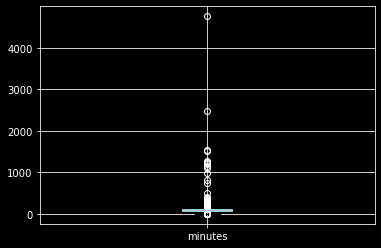

In [150]:
df_matches.boxplot(column="minutes")

We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. <br>

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [151]:
minutes_male_left_bound,   minutes_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "minutes", 2)
minutes_female_left_bound, minutes_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"], "minutes", 2)

Since the are matches, where a player is RET, a lower values is suitable with the semantic.

In [152]:
df_matches.loc[ ((df_matches["minutes"] < minutes_male_left_bound)   | (df_matches["minutes"] > minutes_male_right_bound))   & (df_matches["winner_sex"] == "Male"),   "minutes"] = df_matches.loc[ ((df_matches["minutes"] > minutes_male_left_bound)   | (df_matches["minutes"] < minutes_male_right_bound)) & (df_matches["winner_sex"] == "Male"), "minutes"].mean() 
df_matches.loc[ ((df_matches["minutes"] < minutes_female_left_bound) | (df_matches["minutes"] > minutes_female_right_bound)) & (df_matches["winner_sex"] == "Female"), "minutes"] = df_matches.loc[ ((df_matches["minutes"] > minutes_female_left_bound) | (df_matches["minutes"] < minutes_female_left_bound)) & (df_matches["winner_sex"] == "Female"), "minutes"].mean() 

We fill the missing values with the respective mean.

In [153]:
df_matches.loc[(df_matches["winner_sex"] == "Male")    & (df_matches["minutes"].isnull()), "minutes"] = df_matches.loc[(df_matches["winner_sex"] == "Male"),   "minutes"].mean()
df_matches.loc[(df_matches["winner_sex"] == "Female")  & (df_matches["minutes"].isnull()), "minutes"] = df_matches.loc[(df_matches["winner_sex"] == "Female"), "minutes"].mean()

Finally, we cast the attribute from **Float** into **Integer**

In [154]:
df_matches.minutes = df_matches.minutes.astype(int)

<AxesSubplot:>

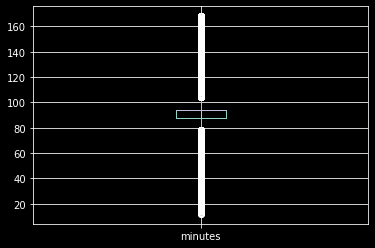

In [155]:
df_matches.boxplot(column="minutes")

#### **<font color=lime> w_ace - l_ace </font>**: *describes the numbers of ace done by the winner or loser player in the match*

Select the null values

In [156]:
df_matches.loc[(df_matches["w_ace"].isnull()) & (df_matches["l_ace"].isnull())]

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,loser_rank,tourney_spectators,tourney_revenue,winner_sex,loser_sex,tie-break
108,2019-0451,Doha,Hard,32,A,2018-12-31,106065,NaN,Marco Cecchinato,R,185.0,ITA,26,105550,NaN,Guido Pella,L,185.0,ARG,28,R16,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,58.0,2923.0,550943.19,Male,Male,0
262,2019-M001,Sydney,Hard,32,P,2019-01-07,202428,NaN,Kiki Bertens,R,182.0,NED,27,202469,NaN,Garbine Muguruza,R,182.0,ESP,25,R16,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,18.0,3258.0,567644.24,Female,Female,0
681,2019-580,Australian Open,Hard,128,G,2019-01-14,215370,NaN,Bianca Andreescu,R,170.0,CAN,18,215042,NaN,Katie Swan,R,170.0,GBR,19,Q1,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,106.0,175.0,15583.0,2781000.18,Female,Female,1
730,2019-580,Australian Open,Hard,128,G,2019-01-14,202424,NaN,Conny Perrin,R,NaN,SUI,28,202489,NaN,Carina Witthoeft,R,NaN,GER,23,Q1,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.0,178.0,15583.0,2781000.18,Female,Female,1
768,2019-580,Australian Open,Hard,128,G,2019-01-14,215370,NaN,Bianca Andreescu,R,170.0,CAN,18,202702,NaN,Tereza Smitkova,R,NaN,CZE,24,Q3,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,106.0,136.0,15583.0,2781000.18,Female,Female,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186067,2020-W-ITF-USA-48A-2020,W25 Orlando FL,Hard,32,25,2020-11-09,216076,WC,Ashley Lahey,U,NaN,USA,21,211765,NaN,Emina Bektas,U,NaN,USA,27,Q2,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,856.0,417.0,2312.0,471620.95,Female,Female,0
186068,2020-W-ITF-USA-48A-2020,W25 Orlando FL,Hard,32,25,2020-11-09,215794,WC,Hurricane Tyra Black,R,NaN,USA,19,222081,NaN,Eleana Yu,R,NaN,USA,16,Q2,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,598.0,1216.0,2312.0,471620.95,Female,Female,1
186069,2020-W-ITF-USA-48A-2020,W25 Orlando FL,Hard,32,25,2020-11-09,210754,NaN,Vivian Heisen,U,NaN,GER,26,220723,NaN,Jessica Livianu,R,NaN,USA,22,Q2,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,429.0,729.0,2312.0,471620.95,Female,Female,0
186070,2020-W-ITF-USA-48A-2020,W25 Orlando FL,Hard,32,25,2020-11-09,211874,NaN,Victoria Rodriguez,U,NaN,MEX,25,202478,NaN,Tara Moore,R,NaN,GBR,28,Q2,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,643.0,454.0,2312.0,471620.95,Female,Female,1


In [157]:
print("We discover\t" + str(df_matches["w_ace"].isnull().sum()) + "\t null records for the w_ace attribute")
print("We discover\t" + str(df_matches["l_ace"].isnull().sum())  + "\t null records for the l_ace attribute")

We discover	65434	 null records for the w_ace attribute
We discover	65435	 null records for the l_ace attribute


In [158]:
#df_matches, _ = clear_null_records_for_attribute(df_matches, "w_ace")
#df_matches, _ = clear_null_records_for_attribute(df_matches, "l_ace")

We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [159]:
w_ace_male_left_bound,   w_ace_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_ace", 2.5)
w_ace_female_left_bound, w_ace_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_ace", 2.5)

l_ace_male_left_bound,    l_ace_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_ace", 2.5)
l_ace_female_left_bound,  l_ace_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_ace", 2.5)

We replace the detected outlier with the mean of the attribute

In [160]:
df_matches.loc[((df_matches["w_ace"] < float(w_ace_male_left_bound) )   | (df_matches["w_ace"] > float(w_ace_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_ace"] = df_matches.loc[((df_matches["w_ace"] > float(w_ace_male_left_bound) )   | (df_matches["w_ace"] < float(w_ace_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_ace"].mean()
df_matches.loc[((df_matches["w_ace"] < float(w_ace_female_left_bound) ) | (df_matches["w_ace"] > float(w_ace_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_ace"] = df_matches.loc[((df_matches["w_ace"] > float(w_ace_female_left_bound) ) | (df_matches["w_ace"] < float(w_ace_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_ace"].mean()

df_matches.loc[((df_matches["l_ace"] < float(l_ace_male_left_bound) )   | (df_matches["l_ace"] > float(l_ace_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_ace"] = df_matches.loc[((df_matches["l_ace"] > float(l_ace_male_left_bound) )   | (df_matches["l_ace"] < float(l_ace_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_ace"].mean()
df_matches.loc[((df_matches["l_ace"] < float(l_ace_female_left_bound) ) | (df_matches["l_ace"] > float(l_ace_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_ace"] = df_matches.loc[((df_matches["l_ace"] > float(l_ace_female_left_bound) ) | (df_matches["l_ace"] < float(l_ace_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_ace"].mean()

For the remains missing value, we can fill with the mean 

In [161]:
w_ace_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_ace"].mean()
w_ace_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_ace"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_ace"].isnull()), "w_ace"] = w_ace_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_ace"].isnull()), "w_ace"] = w_ace_female_mean

In [162]:
l_ace_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_ace"].mean()
l_ace_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_ace"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_ace"].isnull()), "l_ace"] = l_ace_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_ace"].isnull()), "l_ace"] = l_ace_female_mean

Check if we replace all the null **w_ace** and **l_ace**

In [163]:
print("Values w_ace - l_ace: " + str( (df_matches["w_ace"].isnull().sum()) + (df_matches["l_ace"].isnull().sum())))

Values w_ace - l_ace: 0


Finally, we cast the attribute from **Float** into **Integer**

In [164]:
df_matches.w_ace = df_matches.w_ace.astype(int)
df_matches.l_ace = df_matches.l_ace.astype(int)

#### **<font color=lime> w_df - l_df </font>**: *describes the numbers of double fail done by the winner or loser player in the match*

Select the null values

In [165]:
print("We discover\t" + str(df_matches["w_df"].isnull().sum()) + "\t null records for the w_df attribute")
print("We discover\t" + str(df_matches["l_df"].isnull().sum())  + "\t null records for the l_df attribute")

We discover	65435	 null records for the w_df attribute
We discover	65435	 null records for the l_df attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [166]:
w_df_male_left_bound,   w_df_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_df", 2.5)
w_df_female_left_bound, w_df_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_df", 2.5)

l_df_male_left_bound,    l_df_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_df", 2.5)
l_df_female_left_bound,  l_df_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_df", 2.5)

We replace the detected outlier with the mean of the attribute

In [167]:
df_matches.loc[((df_matches["w_df"] < float(w_df_male_left_bound) )   | (df_matches["w_df"] > float(w_df_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_df"] = df_matches.loc[((df_matches["w_df"] > float(w_df_male_left_bound) )   | (df_matches["w_df"] < float(w_df_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_df"].mean()
df_matches.loc[((df_matches["w_df"] < float(w_df_female_left_bound) ) | (df_matches["w_df"] > float(w_df_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_df"] = df_matches.loc[((df_matches["w_df"] > float(w_df_female_left_bound) ) | (df_matches["w_df"] < float(w_df_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_df"].mean()

df_matches.loc[((df_matches["l_df"] < float(l_df_male_left_bound) )   | (df_matches["l_df"] > float(l_df_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_df"] = df_matches.loc[((df_matches["l_df"] > float(l_df_male_left_bound) )   | (df_matches["l_df"] < float(l_df_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_df"].mean()
df_matches.loc[((df_matches["l_df"] < float(l_df_female_left_bound) ) | (df_matches["l_df"] > float(l_df_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_df"] = df_matches.loc[((df_matches["l_df"] > float(l_df_female_left_bound) ) | (df_matches["l_df"] < float(l_df_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_df"].mean()

For the remains missing value, we can fill with the mean 

In [168]:
w_df_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_df"].mean()
w_df_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_df"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_df"].isnull()), "w_df"] = w_df_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_df"].isnull()), "w_df"] = w_df_female_mean

In [169]:
l_df_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_df"].mean()
l_df_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_df"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_df"].isnull()), "l_df"] = l_df_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_df"].isnull()), "l_df"] = l_df_female_mean

Check if we replace all the null **w_df** and **l_df**

In [170]:
print("Values w_df - l_df: " + str(df_matches["w_df"].isnull().sum()) + str(df_matches["l_df"].isnull().sum()))

Values w_df - l_df: 00


Finally, we cast the attribute from **Float** into **Integer**.

In [171]:
df_matches.w_df = df_matches.w_df.astype(int)
df_matches.l_df = df_matches.l_df.astype(int)

#### **<font color=lime> w_svpt	 - l_svpt </font>**: *describes the numbers of serve point done by the winner or loser player in the match*

Select the null values

In [172]:
print("We discover\t" + str(df_matches["w_svpt"].isnull().sum()) + "\t null records for the w_svpt attribute")
print("We discover\t" + str(df_matches["l_svpt"].isnull().sum())  + "\t null records for the l_svpt attribute")

We discover	65434	 null records for the w_svpt attribute
We discover	65435	 null records for the l_svpt attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [173]:
w_svpt_male_left_bound,   w_svpt_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_svpt", 2.5)
w_svpt_female_left_bound, w_svpt_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_svpt", 2.5)

l_svpt_male_left_bound,    l_svpt_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_svpt", 2.5)
l_svpt_female_left_bound,  l_svpt_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_svpt", 2.5)

We replace the detected outlier with the mean of the attribute

In [174]:
df_matches.loc[((df_matches["w_svpt"] < float(w_svpt_male_left_bound) )   | (df_matches["w_svpt"] > float(w_svpt_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_svpt"] = df_matches.loc[((df_matches["w_svpt"] > float(w_svpt_male_left_bound) )   | (df_matches["w_svpt"] < float(w_svpt_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_svpt"].mean()
df_matches.loc[((df_matches["w_svpt"] < float(w_svpt_female_left_bound) ) | (df_matches["w_svpt"] > float(w_svpt_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_svpt"] = df_matches.loc[((df_matches["w_svpt"] > float(w_svpt_female_left_bound) ) | (df_matches["w_svpt"] < float(w_svpt_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_svpt"].mean()

df_matches.loc[((df_matches["l_svpt"] < float(l_svpt_male_left_bound) )   | (df_matches["l_svpt"] > float(l_svpt_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_svpt"] = df_matches.loc[((df_matches["l_svpt"] > float(l_svpt_male_left_bound) )   | (df_matches["l_svpt"] < float(l_svpt_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_svpt"].mean()
df_matches.loc[((df_matches["l_svpt"] < float(l_svpt_female_left_bound) ) | (df_matches["l_svpt"] > float(l_svpt_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_svpt"] = df_matches.loc[((df_matches["l_svpt"] > float(l_svpt_female_left_bound) ) | (df_matches["l_svpt"] < float(l_svpt_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_svpt"].mean()

For the remains missing value, we can fill with the mean 

In [175]:
w_svpt_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_svpt"].mean()
w_svpt_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_svpt"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_svpt"].isnull()), "w_svpt"] = w_svpt_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_svpt"].isnull()), "w_svpt"] = w_svpt_female_mean

In [176]:
l_svpt_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_svpt"].mean()
l_svpt_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_svpt"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_svpt"].isnull()), "l_svpt"] = l_svpt_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_svpt"].isnull()), "l_svpt"] = l_svpt_female_mean

Check if we replace all the null **w_svpt** and **l_svpt**

In [177]:
print("Values w_svpt - l_svpt: " + str(df_matches["w_svpt"].isnull().sum()) + str(df_matches["l_svpt"].isnull().sum()))

Values w_svpt - l_svpt: 00


Finally, we cast the attribute from **Float** into **Integer**.

In [178]:
df_matches.w_svpt = df_matches.w_svpt.astype(int)
df_matches.l_svpt = df_matches.l_svpt.astype(int)

#### **<font color=lime> w_1stIn - l_1stIn </font>**: *describes the numbers of first serves done by the winner or loser player in the match*

Select the null values

In [179]:
print("We discover\t" + str(df_matches["w_1stIn"].isnull().sum()) + "\t null records for the w_1stIn attribute")
print("We discover\t" + str(df_matches["l_1stIn"].isnull().sum())  + "\t null records for the l_1stIn attribute")

We discover	65434	 null records for the w_1stIn attribute
We discover	65436	 null records for the l_1stIn attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [180]:
w_1stIn_male_left_bound,   w_1stIn_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_1stIn", 2.5)
w_1stIn_female_left_bound, w_1stIn_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_1stIn", 2.5)

l_1stIn_male_left_bound,    l_1stIn_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_1stIn", 2.5)
l_1stIn_female_left_bound,  l_1stIn_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_1stIn", 2.5)

We replace the detected outlier with the mean of the attribute

In [181]:
df_matches.loc[((df_matches["w_1stIn"] < float(w_1stIn_male_left_bound) )   | (df_matches["w_1stIn"] > float(w_1stIn_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_1stIn"] = df_matches.loc[((df_matches["w_1stIn"] > float(w_1stIn_male_left_bound) )   | (df_matches["w_1stIn"] < float(w_1stIn_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_1stIn"].mean()
df_matches.loc[((df_matches["w_1stIn"] < float(w_1stIn_female_left_bound) ) | (df_matches["w_1stIn"] > float(w_1stIn_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_1stIn"] = df_matches.loc[((df_matches["w_1stIn"] > float(w_1stIn_female_left_bound) ) | (df_matches["w_1stIn"] < float(w_1stIn_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_1stIn"].mean()

df_matches.loc[((df_matches["l_1stIn"] < float(l_1stIn_male_left_bound) )   | (df_matches["l_1stIn"] > float(l_1stIn_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_1stIn"] = df_matches.loc[((df_matches["l_1stIn"] > float(l_1stIn_male_left_bound) )   | (df_matches["l_1stIn"] < float(l_1stIn_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_1stIn"].mean()
df_matches.loc[((df_matches["l_1stIn"] < float(l_1stIn_female_left_bound) ) | (df_matches["l_1stIn"] > float(l_1stIn_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_1stIn"] = df_matches.loc[((df_matches["l_1stIn"] > float(l_1stIn_female_left_bound) ) | (df_matches["l_1stIn"] < float(l_1stIn_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_1stIn"].mean()

For the remains missing value, we can fill with the mean 

In [182]:
w_1stIn_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_1stIn"].mean()
w_1stIn_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_1stIn"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_1stIn"].isnull()), "w_1stIn"] = w_1stIn_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_1stIn"].isnull()), "w_1stIn"] = w_1stIn_female_mean

In [183]:
l_1stIn_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_1stIn"].mean()
l_1stIn_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_1stIn"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_1stIn"].isnull()), "l_1stIn"] = l_1stIn_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_1stIn"].isnull()), "l_1stIn"] = l_1stIn_female_mean

Check if we replace all the null **w_1stIn** and **l_1stIn**

In [184]:
print("Values w_1stIn - l_1stIn: " + str( (df_matches["w_1stIn"].isnull().sum()) + (df_matches["l_1stIn"].isnull().sum())))

Values w_1stIn - l_1stIn: 0


Finally, we cast the attribute from **Float** into **Integer**.

In [185]:
df_matches.w_1stIn = df_matches.w_1stIn.astype(int)
df_matches.l_1stIn = df_matches.l_1stIn.astype(int)

#### **<font color=lime> w_1stWon - l_1stWon </font>**: *describes the numbers of first serves point won by the winner or loser player in the match*

Select the null values

In [186]:
print("We discover\t" + str(df_matches["w_1stWon"].isnull().sum()) + "\t null records for the w_1stWon attribute")
print("We discover\t" + str(df_matches["l_1stWon"].isnull().sum())  + "\t null records for the l_1stWon attribute")

We discover	65434	 null records for the w_1stWon attribute
We discover	65435	 null records for the l_1stWon attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [187]:
w_1stWon_male_left_bound,   w_1stWon_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_1stWon", 2.5)
w_1stWon_female_left_bound, w_1stWon_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_1stWon", 2.5)

l_1stWon_male_left_bound,    l_1stWon_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_1stWon", 2.5)
l_1stWon_female_left_bound,  l_1stWon_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_1stWon", 2.5)

We replace the detected outlier with the mean of the attribute

In [188]:
df_matches.loc[((df_matches["w_1stWon"] < float(w_1stWon_male_left_bound) )   | (df_matches["w_1stWon"] > float(w_1stWon_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_1stWon"] = df_matches.loc[((df_matches["w_1stWon"] > float(w_1stWon_male_left_bound) )   | (df_matches["w_1stWon"] < float(w_1stWon_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_1stWon"].mean()
df_matches.loc[((df_matches["w_1stWon"] < float(w_1stWon_female_left_bound) ) | (df_matches["w_1stWon"] > float(w_1stWon_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_1stWon"] = df_matches.loc[((df_matches["w_1stWon"] > float(w_1stWon_female_left_bound) ) | (df_matches["w_1stWon"] < float(w_1stWon_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_1stWon"].mean()

df_matches.loc[((df_matches["l_1stWon"] < float(l_1stWon_male_left_bound) )   | (df_matches["l_1stWon"] > float(l_1stWon_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_1stWon"] = df_matches.loc[((df_matches["l_1stWon"] > float(l_1stWon_male_left_bound) )   | (df_matches["l_1stWon"] < float(l_1stWon_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_1stWon"].mean()
df_matches.loc[((df_matches["l_1stWon"] < float(l_1stWon_female_left_bound) ) | (df_matches["l_1stWon"] > float(l_1stWon_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_1stWon"] = df_matches.loc[((df_matches["l_1stWon"] > float(l_1stWon_female_left_bound) ) | (df_matches["l_1stWon"] < float(l_1stWon_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_1stWon"].mean()

For the remains missing value, we can fill with the mean 

In [189]:
w_1stWon_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_1stWon"].mean()
w_1stWon_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_1stWon"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_1stWon"].isnull()), "w_1stWon"] = w_1stWon_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_1stWon"].isnull()), "w_1stWon"] = w_1stWon_female_mean

In [190]:
l_1stWon_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_1stWon"].mean()
l_1stWon_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_1stWon"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_1stWon"].isnull()), "l_1stWon"] = l_1stWon_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_1stWon"].isnull()), "l_1stWon"] = l_1stWon_female_mean

Check if we replace all the null **w_1stWon** and **l_1stWon**

In [191]:
print("Values w_1stWon - l_1stWon: " + str((df_matches["w_1stWon"].isnull().sum()) + (df_matches["l_1stWon"].isnull().sum())))

Values w_1stWon - l_1stWon: 0


Finally, we cast the attribute from **Float** into **Integer**.

In [192]:
df_matches.w_1stWon = df_matches.w_1stWon.astype(int)
df_matches.l_1stWon = df_matches.l_1stWon.astype(int)

#### **<font color=lime> w_2ndWon - l_2ndWon </font>**: *describes the numbers of second serves point won by the winner or loser player in the match*

Select the null values

In [193]:
print("We discover\t" + str(df_matches["w_2ndWon"].isnull().sum()) + "\t null records for the w_2ndWon attribute")
print("We discover\t" + str(df_matches["l_2ndWon"].isnull().sum())  + "\t null records for the l_2ndWon attribute")

We discover	65436	 null records for the w_2ndWon attribute
We discover	65435	 null records for the l_2ndWon attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [194]:
w_2ndWon_male_left_bound,   w_2ndWon_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_2ndWon", 2.5)
w_2ndWon_female_left_bound, w_2ndWon_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_2ndWon", 2.5)

l_2ndWon_male_left_bound,    l_2ndWon_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_2ndWon", 2.5)
l_2ndWon_female_left_bound,  l_2ndWon_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_2ndWon", 2.5)

We replace the detected outlier with the mean of the attribute

In [195]:
df_matches.loc[((df_matches["w_2ndWon"] < float(w_2ndWon_male_left_bound) )   | (df_matches["w_2ndWon"] > float(w_2ndWon_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_2ndWon"] = df_matches.loc[((df_matches["w_2ndWon"] > float(w_2ndWon_male_left_bound) )   | (df_matches["w_2ndWon"] < float(w_2ndWon_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_2ndWon"].mean()
df_matches.loc[((df_matches["w_2ndWon"] < float(w_2ndWon_female_left_bound) ) | (df_matches["w_2ndWon"] > float(w_2ndWon_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_2ndWon"] = df_matches.loc[((df_matches["w_2ndWon"] > float(w_2ndWon_female_left_bound) ) | (df_matches["w_2ndWon"] < float(w_2ndWon_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_2ndWon"].mean()

df_matches.loc[((df_matches["l_2ndWon"] < float(l_2ndWon_male_left_bound) )   | (df_matches["l_2ndWon"] > float(l_2ndWon_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_2ndWon"] = df_matches.loc[((df_matches["l_2ndWon"] > float(l_2ndWon_male_left_bound) )   | (df_matches["l_2ndWon"] < float(l_2ndWon_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_2ndWon"].mean()
df_matches.loc[((df_matches["l_2ndWon"] < float(l_2ndWon_female_left_bound) ) | (df_matches["l_2ndWon"] > float(l_2ndWon_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_2ndWon"] = df_matches.loc[((df_matches["l_2ndWon"] > float(l_2ndWon_female_left_bound) ) | (df_matches["l_2ndWon"] < float(l_2ndWon_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_2ndWon"].mean()

For the remains missing value, we can fill with the mean 

In [196]:
w_2ndWon_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_2ndWon"].mean()
w_2ndWon_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_2ndWon"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_2ndWon"].isnull()), "w_2ndWon"] = w_2ndWon_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_2ndWon"].isnull()), "w_2ndWon"] = w_2ndWon_female_mean

In [197]:
l_2ndWon_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_2ndWon"].mean()
l_2ndWon_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_2ndWon"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_2ndWon"].isnull()), "l_2ndWon"] = l_2ndWon_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_2ndWon"].isnull()), "l_2ndWon"] = l_2ndWon_female_mean

Check if we replace all the null **w_2ndWon** and **l_2ndWon**

In [198]:
print("Values w_2ndWon - l_2ndWon: " + str((df_matches["w_2ndWon"].isnull().sum()) + (df_matches["l_2ndWon"].isnull().sum())))

Values w_2ndWon - l_2ndWon: 0


Finally, we cast the attribute from **Float** into **Integer**.

In [199]:
df_matches.w_2ndWon = df_matches.w_2ndWon.astype(int)
df_matches.l_2ndWon = df_matches.l_2ndWon.astype(int)

#### **<font color=lime> w_SvGms - l_SvGms </font>**: *describes the numbers of serves game done by the winner or loser player in the match*

Select the null values

In [200]:
print("We discover\t" + str(df_matches["w_SvGms"].isnull().sum()) + "\t null records for the w_SvGms attribute")
print("We discover\t" + str(df_matches["l_SvGms"].isnull().sum())  + "\t null records for the l_SvGms attribute")

We discover	65431	 null records for the w_SvGms attribute
We discover	65432	 null records for the l_SvGms attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [201]:
w_SvGms_male_left_bound,   w_SvGms_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_SvGms", 2.5)
w_SvGms_female_left_bound, w_SvGms_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_SvGms", 2.5)

l_SvGms_male_left_bound,    l_SvGms_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_SvGms", 2.5)
l_SvGms_female_left_bound,  l_SvGms_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_SvGms", 2.5)

We replace the detected outlier with the mean of the attribute

In [202]:
df_matches.loc[((df_matches["w_SvGms"] < float(w_SvGms_male_left_bound) )   | (df_matches["w_SvGms"] > float(w_SvGms_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_SvGms"] = df_matches.loc[((df_matches["w_SvGms"] > float(w_SvGms_male_left_bound) )   | (df_matches["w_SvGms"] < float(w_SvGms_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_SvGms"].mean()
df_matches.loc[((df_matches["w_SvGms"] < float(w_SvGms_female_left_bound) ) | (df_matches["w_SvGms"] > float(w_SvGms_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_SvGms"] = df_matches.loc[((df_matches["w_SvGms"] > float(w_SvGms_female_left_bound) ) | (df_matches["w_SvGms"] < float(w_SvGms_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_SvGms"].mean()

df_matches.loc[((df_matches["l_SvGms"] < float(l_SvGms_male_left_bound) )   | (df_matches["l_SvGms"] > float(l_SvGms_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_SvGms"] = df_matches.loc[((df_matches["l_SvGms"] > float(l_SvGms_male_left_bound) )   | (df_matches["l_SvGms"] < float(l_SvGms_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_SvGms"].mean()
df_matches.loc[((df_matches["l_SvGms"] < float(l_SvGms_female_left_bound) ) | (df_matches["l_SvGms"] > float(l_SvGms_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_SvGms"] = df_matches.loc[((df_matches["l_SvGms"] > float(l_SvGms_female_left_bound) ) | (df_matches["l_SvGms"] < float(l_SvGms_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_SvGms"].mean()

For the remains missing value, we can fill with the mean 

In [203]:
w_SvGms_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_SvGms"].mean()
w_SvGms_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_SvGms"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_SvGms"].isnull()), "w_SvGms"] = w_SvGms_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_SvGms"].isnull()), "w_SvGms"] = w_SvGms_female_mean

In [204]:
l_SvGms_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_SvGms"].mean()
l_SvGms_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_SvGms"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_SvGms"].isnull()), "l_SvGms"] = l_SvGms_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_SvGms"].isnull()), "l_SvGms"] = l_SvGms_female_mean

Check if we replace all the null **w_1stIn** and **l_1stIn**

In [205]:
print("Values w_SvGms - l_SvGms: " + str((df_matches["w_SvGms"].isnull().sum()) + (df_matches["l_SvGms"].isnull().sum())))

Values w_SvGms - l_SvGms: 0


Finally, we cast the attribute from **Float** into **Integer**.

In [206]:
df_matches.w_SvGms = df_matches.w_SvGms.astype(int)
df_matches.l_SvGms = df_matches.l_SvGms.astype(int)

#### **<font color=lime> w_bpSaved - l_bpSaved </font>**: *describes the numbers of brakepoints saved by the winner or loser player in the match*

Select the null values

In [207]:
print("We discover\t" + str(df_matches["w_bpSaved"].isnull().sum()) + "\t null records for the w_bpSaved attribute")
print("We discover\t" + str(df_matches["l_bpSaved"].isnull().sum())  + "\t null records for the l_bpSaved attribute")

We discover	65434	 null records for the w_bpSaved attribute
We discover	65436	 null records for the l_bpSaved attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [208]:
w_bpSaved_male_left_bound,   w_bpSaved_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_bpSaved", 2.5)
w_bpSaved_female_left_bound, w_bpSaved_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_bpSaved", 2.5)

l_bpSaved_male_left_bound,    l_bpSaved_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_bpSaved", 2.5)
l_bpSaved_female_left_bound,  l_bpSaved_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_bpSaved", 2.5)

We replace the detected outlier with the mean of the attribute

In [209]:
df_matches.loc[((df_matches["w_bpSaved"] < float(w_bpSaved_male_left_bound) )   | (df_matches["w_bpSaved"] > float(w_bpSaved_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_bpSaved"] = df_matches.loc[((df_matches["w_bpSaved"] > float(w_bpSaved_male_left_bound) )   | (df_matches["w_bpSaved"] < float(w_bpSaved_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_bpSaved"].mean()
df_matches.loc[((df_matches["w_bpSaved"] < float(w_bpSaved_female_left_bound) ) | (df_matches["w_bpSaved"] > float(w_bpSaved_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_bpSaved"] = df_matches.loc[((df_matches["w_bpSaved"] > float(w_bpSaved_female_left_bound) ) | (df_matches["w_bpSaved"] < float(w_bpSaved_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_bpSaved"].mean()

df_matches.loc[((df_matches["l_bpSaved"] < float(l_bpSaved_male_left_bound) )   | (df_matches["l_bpSaved"] > float(l_bpSaved_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_bpSaved"] = df_matches.loc[((df_matches["l_bpSaved"] > float(l_bpSaved_male_left_bound) )   | (df_matches["l_bpSaved"] < float(l_bpSaved_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_bpSaved"].mean()
df_matches.loc[((df_matches["l_bpSaved"] < float(l_bpSaved_female_left_bound) ) | (df_matches["l_bpSaved"] > float(l_bpSaved_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_bpSaved"] = df_matches.loc[((df_matches["l_bpSaved"] > float(l_bpSaved_female_left_bound) ) | (df_matches["l_bpSaved"] < float(l_bpSaved_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_bpSaved"].mean()

For the remains missing value, we can fill with the mean 

In [210]:
w_bpSaved_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_bpSaved"].mean()
w_bpSaved_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_bpSaved"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_bpSaved"].isnull()), "w_bpSaved"] = w_bpSaved_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_bpSaved"].isnull()), "w_bpSaved"] = w_bpSaved_female_mean

In [211]:
l_bpSaved_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_bpSaved"].mean()
l_bpSaved_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_bpSaved"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_bpSaved"].isnull()), "l_bpSaved"] = l_bpSaved_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_bpSaved"].isnull()), "l_bpSaved"] = l_bpSaved_female_mean

Check if we replace all the null **w_1stIn** and **l_1stIn**

In [212]:
print("Values w_bpSaved - l_bpSaved: " + str((df_matches["w_bpSaved"].isnull().sum()) + (df_matches["l_bpSaved"].isnull().sum())))

Values w_bpSaved - l_bpSaved: 0


Finally, we cast the attribute from **Float** into **Integer**.

In [213]:
df_matches.w_bpSaved = df_matches.w_bpSaved.astype(int)
df_matches.l_bpSaved = df_matches.l_bpSaved.astype(int)

#### **<font color=lime> w_bpFaced - l_bpFaced </font>**: *describes the numbers of brakepoints faced by the winner or loser player in the match*

Select the null values

In [214]:
print("We discover\t" + str(df_matches["w_bpFaced"].isnull().sum()) + "\t null records for the w_bpFaced attribute")
print("We discover\t" + str(df_matches["l_bpFaced"].isnull().sum())  + "\t null records for the l_bpFaced attribute")

We discover	65434	 null records for the w_bpFaced attribute
We discover	65435	 null records for the l_bpFaced attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [215]:
w_bpFaced_male_left_bound,   w_bpFaced_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "w_bpFaced", 2.5)
w_bpFaced_female_left_bound, w_bpFaced_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "w_bpFaced", 2.5)

l_bpFaced_male_left_bound,    l_bpFaced_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "l_bpFaced", 2.5)
l_bpFaced_female_left_bound,  l_bpFaced_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "l_bpFaced", 2.5)

We replace the detected outlier with the mean of the attribute

In [216]:
df_matches.loc[((df_matches["w_bpFaced"] < float(w_bpFaced_male_left_bound) )   | (df_matches["w_bpFaced"] > float(w_bpFaced_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_bpFaced"] = df_matches.loc[((df_matches["w_bpFaced"] > float(w_bpFaced_male_left_bound) )   | (df_matches["w_bpFaced"] < float(w_bpFaced_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "w_bpFaced"].mean()
df_matches.loc[((df_matches["w_bpFaced"] < float(w_bpFaced_female_left_bound) ) | (df_matches["w_bpFaced"] > float(w_bpFaced_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_bpFaced"] = df_matches.loc[((df_matches["w_bpFaced"] > float(w_bpFaced_female_left_bound) ) | (df_matches["w_bpFaced"] < float(w_bpFaced_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "w_bpFaced"].mean()

df_matches.loc[((df_matches["l_bpFaced"] < float(l_bpFaced_male_left_bound) )   | (df_matches["l_bpFaced"] > float(l_bpFaced_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_bpFaced"] = df_matches.loc[((df_matches["l_bpFaced"] > float(l_bpFaced_male_left_bound) )   | (df_matches["l_bpFaced"] < float(l_bpFaced_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "l_bpFaced"].mean()
df_matches.loc[((df_matches["l_bpFaced"] < float(l_bpFaced_female_left_bound) ) | (df_matches["l_bpFaced"] > float(l_bpFaced_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_bpFaced"] = df_matches.loc[((df_matches["l_bpFaced"] > float(l_bpFaced_female_left_bound) ) | (df_matches["l_bpFaced"] < float(l_bpFaced_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "l_bpFaced"].mean()

For the remains missing value, we can fill with the mean 

In [217]:
w_bpFaced_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "w_bpFaced"].mean()
w_bpFaced_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "w_bpFaced"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["w_bpFaced"].isnull()), "w_bpFaced"] = w_bpFaced_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["w_bpFaced"].isnull()), "w_bpFaced"] = w_bpFaced_female_mean

In [218]:
l_bpFaced_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "l_bpFaced"].mean()
l_bpFaced_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "l_bpFaced"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["l_bpFaced"].isnull()), "l_bpFaced"] = l_bpFaced_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["l_bpFaced"].isnull()), "l_bpFaced"] = l_bpFaced_female_mean

Check if we replace all the null **w_bpFaced** and **l_bpFaced**

In [219]:
print("Values w_bpFaced - l_bpFaced: " + str((df_matches["w_bpFaced"].isnull().sum()) + (df_matches["l_bpFaced"].isnull().sum())))

Values w_bpFaced - l_bpFaced: 0


Finally, we cast the attribute from **Float** into **Integer**.

In [220]:
df_matches.w_bpFaced = df_matches.w_bpFaced.astype(int)
df_matches.l_bpFaced = df_matches.l_bpFaced.astype(int)

#### **<font color=lime> winner_ht - loser_ht </font>**: *describes the height (in cm) of the winner or loser player*

In [221]:
# Helper functions
# VERSIONE SEMPLICE NON TENENDO CONTO DELLO SCARTO DI ETA TRA IL TORNEO DOVE SI PRENDE L-ETA ED IL TORNEO ATTUALE DOVE SI VA A PIZZARE
def get_winner_height(df, winner_id):
    df_winner_id = df[df["winner_id"] == winner_id]
    return df_winner_id["winner_ht"].dropna().mean()

def get_loser_height(df, loser_id):
    df_loser_id = df[df["loser_id"] == loser_id]
    return df_loser_id["loser_ht"].dropna().mean()

def get_player_height_mean(df, player_id):
    player_height = get_winner_height(df, player_id)
    if player_height is not None:
        return player_height
    player_height = get_loser_height(df, player_id)
    if player_height is not None:
        return player_height
    return None

Check if there are missing values

In [222]:
print("We discover\t" + str(df_matches["winner_ht"].isnull().sum()) + "\t null records for the winner_ht attribute")
print("We discover\t" + str(df_matches["loser_ht"].isnull().sum())  + "\t null records for the loser_ht attribute")

We discover	95391	 null records for the winner_ht attribute
We discover	105341	 null records for the loser_ht attribute


We base our future analyzes on the gender of the player, as female players are about double that of male players, as shown above. 

Check outliers using a statistic-based parametric fitting distribution technique (**Hamplex X84**)

In [223]:
winner_ht_male_left_bound,   winner_ht_male_right_bound   = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Male"],   "winner_ht", 2)
winner_ht_female_left_bound, winner_ht_female_right_bound = hamplex_X84_attribute(df_matches[df_matches["winner_sex"] == "Female"],  "winner_ht", 2)

loser_ht_male_left_bound,    loser_ht_male_right_bound    = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Male"],   "loser_ht", 2)
loser_ht_female_left_bound,  loser_ht_female_right_bound  = hamplex_X84_attribute(df_matches[df_matches["loser_sex"] == "Female"],  "loser_ht", 2)

We replace the detected outlier with the mean of the attribute

In [224]:
df_matches.loc[((df_matches["winner_ht"] < float(winner_ht_male_left_bound) )   | (df_matches["winner_ht"] > float(winner_ht_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "winner_ht"] = df_matches.loc[((df_matches["winner_ht"] > float(winner_ht_male_left_bound) )   | (df_matches["winner_ht"] < float(winner_ht_male_right_bound))   & (df_matches["winner_sex"] == "Male")),   "winner_ht"].mean()
df_matches.loc[((df_matches["winner_ht"] < float(winner_ht_female_left_bound) ) | (df_matches["winner_ht"] > float(winner_ht_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "winner_ht"] = df_matches.loc[((df_matches["winner_ht"] > float(winner_ht_female_left_bound) ) | (df_matches["winner_ht"] < float(winner_ht_female_right_bound)) & (df_matches["winner_sex"] == "Female")), "winner_ht"].mean()

df_matches.loc[((df_matches["loser_ht"] < float(loser_ht_male_left_bound) )   | (df_matches["loser_ht"] > float(loser_ht_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "loser_ht"] = df_matches.loc[((df_matches["loser_ht"] > float(loser_ht_male_left_bound) )   | (df_matches["loser_ht"] < float(loser_ht_male_right_bound))   & (df_matches["loser_sex"] == "Male")),   "loser_ht"].mean()
df_matches.loc[((df_matches["loser_ht"] < float(loser_ht_female_left_bound) ) | (df_matches["loser_ht"] > float(loser_ht_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "loser_ht"] = df_matches.loc[((df_matches["loser_ht"] > float(loser_ht_female_left_bound) ) | (df_matches["loser_ht"] < float(loser_ht_female_right_bound)) & (df_matches["loser_sex"] == "Female")), "loser_ht"].mean()

For the remains missing value, we can fill with the mean 

In [225]:
winner_ht_male_mean   = df_matches.loc[df_matches["winner_sex"] == "Male",   "winner_ht"].mean()
winner_ht_female_mean = df_matches.loc[df_matches["winner_sex"] == "Female", "winner_ht"].mean()

df_matches.loc[(df_matches["winner_sex"] == "Male")   & (df_matches["winner_ht"].isnull()), "winner_ht"] = winner_ht_male_mean
df_matches.loc[(df_matches["winner_sex"] == "Female") & (df_matches["winner_ht"].isnull()), "winner_ht"] = winner_ht_female_mean

In [226]:
loser_ht_male_mean   = df_matches.loc[df_matches["loser_sex"] == "Male",   "loser_ht"].mean()
loser_ht_female_mean = df_matches.loc[df_matches["loser_sex"] == "Female", "loser_ht"].mean()

df_matches.loc[(df_matches["loser_sex"] == "Male")   & (df_matches["loser_ht"].isnull()), "loser_ht"] = loser_ht_male_mean
df_matches.loc[(df_matches["loser_sex"] == "Female") & (df_matches["loser_ht"].isnull()), "loser_ht"] = loser_ht_female_mean

Check if we replace all the null **winner_ht** and **loser_ht** attributes.

In [227]:
print("Values winner_ht - loser_ht: " + str((df_matches["winner_ht"].isnull().sum()) + (df_matches["loser_ht"].isnull().sum())))

Values winner_ht - loser_ht: 0


#### **<font color=lime> winner_entry - loser_entry </font>**: *describes the access mode to the tournament to the winner or loser player*

Select the null values

In [228]:
print("We discover\t" + str(df_matches["winner_entry"].isnull().sum()) + "\t null records for the winner_entry attribute")
print("We discover\t" + str(df_matches["loser_entry"].isnull().sum())  + "\t null records for the loser_entry attribute")

We discover	122053	 null records for the winner_entry attribute
We discover	111918	 null records for the loser_entry attribute


From our analys, as goal to create a *player profile*, the attribute **winner_entry** and **loser_entry** are useless, because it don't give a significant characterization for the player. <br>
Then, we procede to drop the attribute.

In [229]:
df_matches.drop("winner_entry", axis=1, inplace=True)
df_matches.drop("loser_entry", axis=1, inplace=True)

### **<font color=orange> 1.2 Data Preparation </font>**
Improve the quality of your data and prepare it by extracting new features interesting for describing the player profile and his behavior derivable from matches <br>

Before we create the player profile, we need to extract other extra features from the cleaned data set

#### **<font color=turquoise> 1.2.1 Create Winners and Losers player profile </font>**


We create the **winners_profile** that include all related winner attribute

In [230]:
winners_profile = df_matches.loc[:, ["winner_id", "winner_name", "winner_sex", "winner_ioc", "winner_age", "winner_ht", "winner_hand", "winner_rank", "surface", "tie-break", "w_ace", "w_df", "w_svpt", "w_1stIn", "w_1stWon", "w_2ndWon", "w_SvGms", "w_bpSaved", "w_bpFaced"]]
winners_profile.columns = ["id", "name", "sex", "ioc", "age", "ht", "hand", "rank", "surface", "tie-break", "ace", "df", "svpt", "1stIn", "1stWon", "2ndWon", "SvGms", "bpSaved", "bpFaced"]
winners_profile

,id,name,sex,ioc,age,ht,hand,rank,surface,tie-break,ace,df,svpt,1stIn,1stWon,2ndWon,SvGms,bpSaved,bpFaced
0,105453,Kei Nishikori,Male,JPN,23,178.000000,R,9.0,Hard,0,3,3,77,44,31,17,13,3,6
1,106421,Daniil Medvedev,Male,RUS,22,198.000000,R,16.0,Hard,1,10,1,52,33,28,14,10,0,1
2,105453,Kei Nishikori,Male,JPN,29,178.000000,R,9.0,Hard,0,2,2,47,33,26,9,8,2,2
3,104542,Jo-Wilfried Tsonga,Male,FRA,33,188.000000,R,239.0,Hard,1,12,2,68,43,34,15,11,4,5
4,106421,Daniil Medvedev,Male,RUS,22,198.000000,R,16.0,Hard,1,12,3,105,68,48,25,16,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186070,211874,Victoria Rodriguez,Female,MEX,25,177.438651,U,643.0,Hard,1,2,3,69,43,29,12,10,3,6
186071,213789,Katarina Jokic,Female,BIH,22,177.438651,U,923.0,Hard,0,2,3,69,43,29,12,10,3,6
186090,201551,Arantxa Rus,Female,NED,27,180.000000,L,167.0,Hard,0,2,3,69,52,29,12,14,4,10
186124,206368,Veronika Kudermetova,Female,RUS,21,175.000000,R,255.0,Hard,1,10,8,63,43,32,12,10,2,5


We create the **losers_profile** that include all related loser attribute

In [231]:
losers_profile = df_matches.loc[:, ["loser_id", "loser_name", "loser_sex", "loser_ioc", "loser_age", "loser_ht", "loser_hand", "loser_rank", "surface", "l_ace", "l_df", "l_svpt", "l_1stIn", "l_1stWon", "l_2ndWon", "l_SvGms", "l_bpSaved", "l_bpFaced"]]
losers_profile.columns = ["id", "name", "sex", "ioc", "age", "ht", "hand", "rank", "surface", "ace", "df", "svpt", "1stIn", "1stWon", "2ndWon", "SvGms", "bpSaved", "bpFaced"]
losers_profile

,id,name,sex,ioc,age,ht,hand,rank,surface,ace,df,svpt,1stIn,1stWon,2ndWon,SvGms,bpSaved,bpFaced
0,106421,Daniil Medvedev,Male,RUS,22,198.00000,R,16.0,Hard,8,6,100,54,34,20,14,10,15
1,104542,Jo-Wilfried Tsonga,Male,FRA,33,188.00000,R,239.0,Hard,3,2,77,52,36,7,10,10,13
2,104871,Jeremy Chardy,Male,FRA,31,188.00000,R,40.0,Hard,10,3,46,27,15,6,8,1,5
3,200282,Alex De Minaur,Male,AUS,19,183.00000,R,31.0,Hard,1,2,81,60,38,9,11,4,6
4,105683,Milos Raonic,Male,CAN,28,196.00000,R,18.0,Hard,3,5,94,56,46,19,15,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186070,202478,Tara Moore,Female,GBR,28,177.57635,R,454.0,Hard,1,3,71,43,25,10,10,4,9
186071,205922,Chanelle Van Nguyen,Female,USA,26,177.57635,U,627.0,Hard,1,3,71,43,25,10,10,4,9
186090,201554,Vitalia Diatchenko,Female,RUS,28,177.57635,R,176.0,Hard,7,3,71,43,25,10,10,4,9
186124,214562,Ingrid Neel,Female,USA,20,177.57635,U,704.0,Hard,1,3,68,43,25,10,10,4,9


#### **<font color=turquoise> 1.2.2 Create Players Profile </font>**

Appending the losers and the winner we can create a global **players_profile** including all the games for both winners and losers.

In [232]:
players_profile = winners_profile.append(losers_profile)
players_profile

,id,name,sex,ioc,age,ht,hand,rank,surface,tie-break,ace,df,svpt,1stIn,1stWon,2ndWon,SvGms,bpSaved,bpFaced
0,105453,Kei Nishikori,Male,JPN,23,178.00000,R,9.0,Hard,0.0,3,3,77,44,31,17,13,3,6
1,106421,Daniil Medvedev,Male,RUS,22,198.00000,R,16.0,Hard,1.0,10,1,52,33,28,14,10,0,1
2,105453,Kei Nishikori,Male,JPN,29,178.00000,R,9.0,Hard,0.0,2,2,47,33,26,9,8,2,2
3,104542,Jo-Wilfried Tsonga,Male,FRA,33,188.00000,R,239.0,Hard,1.0,12,2,68,43,34,15,11,4,5
4,106421,Daniil Medvedev,Male,RUS,22,198.00000,R,16.0,Hard,1.0,12,3,105,68,48,25,16,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186070,202478,Tara Moore,Female,GBR,28,177.57635,R,454.0,Hard,NaN,1,3,71,43,25,10,10,4,9
186071,205922,Chanelle Van Nguyen,Female,USA,26,177.57635,U,627.0,Hard,NaN,1,3,71,43,25,10,10,4,9
186090,201554,Vitalia Diatchenko,Female,RUS,28,177.57635,R,176.0,Hard,NaN,7,3,71,43,25,10,10,4,9
186124,214562,Ingrid Neel,Female,USA,20,177.57635,U,704.0,Hard,NaN,1,3,68,43,25,10,10,4,9


Because the **tie-break** attibute is only for the winners players, we fill the missing value (corresponding to the loser players) with **0**.

In [233]:
players_profile["tie-break"] = players_profile["tie-break"].fillna(0)

We create the **players_stats** profile that include all tennis stats for all the distinct players

In [234]:
players_stats_sum  = players_profile.groupby(["id"]).sum()
players_stats_mean = players_profile.groupby(["id"]).mean()

for cols in players_stats_mean.columns:
    players_stats_mean[cols] = players_stats_mean[cols].astype(int)

players_stats_sum.drop(["age", "ht", "rank"], axis=1, inplace = True)
players_stats_mean.drop(["age", "ht", "rank"], axis=1, inplace = True)

players_stats_sum.columns = [str(col) + '_sum' for col in players_stats_sum.columns]
players_stats_mean.columns = [str(col) + '_mean' for col in players_stats_mean.columns]

We create the **players_registry** profile that include all the personal information for all the distinct players

In [235]:
players_registry = players_profile.copy()
players_registry.drop(["surface", "ace", "tie-break", "df", "svpt", "1stIn", "1stWon", "2ndWon", "SvGms", "bpSaved", "bpFaced"], axis=1, inplace=True)
players_registry.drop_duplicates(["id"], keep= 'last', inplace = True)

players_registry["ht"] = players_registry["ht"].astype(int)
players_registry["rank"] = players_registry["rank"].astype(int)

players_registry

,id,name,sex,ioc,age,ht,hand,rank
6776,105935,Duilio Beretta,Male,PER,25,185,R,1428
6779,126502,Luis Diego Chavez Villalpando,Male,ESP,22,185,U,1581
6793,138845,Anthony Jackie Tang,Male,HKG,19,185,U,1519
6806,202165,Alberto Lim,Male,PHI,18,185,R,1371
6820,134886,Sharmal Dissanayake,Male,SRI,21,185,R,1455
...,...,...,...,...,...,...,...,...
186070,202478,Tara Moore,Female,GBR,28,177,R,454
186071,205922,Chanelle Van Nguyen,Female,USA,26,177,U,627
186090,201554,Vitalia Diatchenko,Female,RUS,28,177,R,176
186124,214562,Ingrid Neel,Female,USA,20,177,U,704


#### **<font color=turquoise> 1.2.3 Extraction of new Features </font>**

We extract new information from the winners and losers profile: the total number of won and lost matches for the players

In [236]:
temp_df_winners_count = pd.DataFrame(columns=["id", "tot_win"])
temp_df_winners_count["id"] = winners_profile["id"]
temp_df_winners_count["tot_win"] = winners_profile["id"].map(winners_profile["id"].value_counts()) 
temp_df_winners_count.drop_duplicates(inplace = True)

temp_df_losers_count = pd.DataFrame(columns=["id", "tot_los"])
temp_df_losers_count["id"] = losers_profile["id"]
temp_df_losers_count["tot_los"] = losers_profile["id"].map(losers_profile["id"].value_counts()) 
temp_df_losers_count.drop_duplicates(inplace = True)

We merge the **players_registry** profile with the **players_stats** profile using the **id** player attribute as primary key.

In [237]:
players_output = players_registry.merge(players_stats_sum, on = "id", how = "inner").merge(players_stats_mean, on = "id", how = "inner")
players_output

,id,name,sex,ioc,age,ht,hand,rank,tie-break_sum,ace_sum,df_sum,svpt_sum,1stIn_sum,1stWon_sum,2ndWon_sum,SvGms_sum,bpSaved_sum,bpFaced_sum,tie-break_mean,ace_mean,df_mean,svpt_mean,1stIn_mean,1stWon_mean,2ndWon_mean,SvGms_mean,bpSaved_mean,bpFaced_mean
0,105935,Duilio Beretta,Male,PER,25,185,R,1428,0.0,2,1,42,27,21,12,8,2,2,0,2,1,42,27,21,12,8,2,2
1,126502,Luis Diego Chavez Villalpando,Male,ESP,22,185,U,1581,0.0,4,2,70,43,32,14,11,3,4,0,4,2,70,43,32,14,11,3,4
2,138845,Anthony Jackie Tang,Male,HKG,19,185,U,1519,1.0,6,4,81,41,29,22,11,4,7,1,6,4,81,41,29,22,11,4,7
3,202165,Alberto Lim,Male,PHI,18,185,R,1371,0.0,9,5,65,37,27,15,10,4,6,0,9,5,65,37,27,15,10,4,6
4,134886,Sharmal Dissanayake,Male,SRI,21,185,R,1455,0.0,1,5,66,46,26,9,11,2,7,0,1,5,66,46,26,9,11,2,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4365,202478,Tara Moore,Female,GBR,28,177,R,454,16.0,306,685,13780,8263,5161,2217,1963,762,1569,0,1,3,72,43,27,11,10,4,8
4366,205922,Chanelle Van Nguyen,Female,USA,26,177,U,627,1.0,96,210,4918,3010,1854,752,700,254,552,0,1,3,70,43,26,10,10,3,7
4367,201554,Vitalia Diatchenko,Female,RUS,28,177,R,176,22.0,345,803,13929,8523,5432,2297,2038,735,1506,0,1,4,70,43,27,11,10,3,7
4368,214562,Ingrid Neel,Female,USA,20,177,U,704,5.0,85,185,4185,2579,1559,623,586,224,483,0,1,3,70,43,26,10,9,3,8


We add to the **players_output** profile the new information about the total number of won and lost matches.

In [238]:
players_output = players_output.merge(temp_df_winners_count, on='id', how='left')
players_output = players_output.merge(temp_df_losers_count, on='id', how='left')
players_output["tot_win"] = players_output["tot_win"].fillna(0)
players_output["tot_los"] = players_output["tot_los"].fillna(0)
players_output["tot_games"] = players_output["tot_win"] + players_output["tot_los"]
players_output["winrate"] = (players_output["tot_win"] / players_output["tot_games"] * 100).round(2)

players_output

,id,name,sex,ioc,age,ht,hand,rank,tie-break_sum,ace_sum,df_sum,svpt_sum,1stIn_sum,1stWon_sum,2ndWon_sum,SvGms_sum,bpSaved_sum,bpFaced_sum,tie-break_mean,ace_mean,df_mean,svpt_mean,1stIn_mean,1stWon_mean,2ndWon_mean,SvGms_mean,bpSaved_mean,bpFaced_mean,tot_win,tot_los,tot_games,winrate
0,105935,Duilio Beretta,Male,PER,25,185,R,1428,0.0,2,1,42,27,21,12,8,2,2,0,2,1,42,27,21,12,8,2,2,1.0,0.0,1.0,100.00
1,126502,Luis Diego Chavez Villalpando,Male,ESP,22,185,U,1581,0.0,4,2,70,43,32,14,11,3,4,0,4,2,70,43,32,14,11,3,4,1.0,0.0,1.0,100.00
2,138845,Anthony Jackie Tang,Male,HKG,19,185,U,1519,1.0,6,4,81,41,29,22,11,4,7,1,6,4,81,41,29,22,11,4,7,1.0,0.0,1.0,100.00
3,202165,Alberto Lim,Male,PHI,18,185,R,1371,0.0,9,5,65,37,27,15,10,4,6,0,9,5,65,37,27,15,10,4,6,1.0,0.0,1.0,100.00
4,134886,Sharmal Dissanayake,Male,SRI,21,185,R,1455,0.0,1,5,66,46,26,9,11,2,7,0,1,5,66,46,26,9,11,2,7,1.0,0.0,1.0,100.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4365,202478,Tara Moore,Female,GBR,28,177,R,454,16.0,306,685,13780,8263,5161,2217,1963,762,1569,0,1,3,72,43,27,11,10,4,8,81.0,109.0,190.0,42.63
4366,205922,Chanelle Van Nguyen,Female,USA,26,177,U,627,1.0,96,210,4918,3010,1854,752,700,254,552,0,1,3,70,43,26,10,10,3,7,26.0,44.0,70.0,37.14
4367,201554,Vitalia Diatchenko,Female,RUS,28,177,R,176,22.0,345,803,13929,8523,5432,2297,2038,735,1506,0,1,4,70,43,27,11,10,3,7,125.0,73.0,198.0,63.13
4368,214562,Ingrid Neel,Female,USA,20,177,U,704,5.0,85,185,4185,2579,1559,623,586,224,483,0,1,3,70,43,26,10,9,3,8,18.0,41.0,59.0,30.51


Add new feature: % of ace related to the numbers of the first serve made

In [239]:
players_output["ace_on_service(%)"]         = (players_output["ace_sum"] / players_output["svpt_sum"] * 100).round(2)
players_output["df_on_service(%)"]          = (players_output["df_sum"] / players_output["svpt_sum"] * 100).round(2)
players_output["point_on_first_service(%)"] = (players_output["1stWon_sum"] / players_output["1stIn_sum"] * 100).round(2)

players_output.loc[players_output["svpt_sum"] == 0, ["ace_on_service(%)", "df_on_service(%)"]] = 0 # else we could have NaN values
players_output.loc[players_output["1stIn_sum"] == 0, "point_on_first_service(%)"] = 0 # else we could have NaN values

players_output.head()

,id,name,sex,ioc,age,ht,hand,rank,tie-break_sum,ace_sum,df_sum,svpt_sum,1stIn_sum,1stWon_sum,2ndWon_sum,SvGms_sum,bpSaved_sum,bpFaced_sum,tie-break_mean,ace_mean,df_mean,svpt_mean,1stIn_mean,1stWon_mean,2ndWon_mean,SvGms_mean,bpSaved_mean,bpFaced_mean,tot_win,tot_los,tot_games,winrate,ace_on_service(%),df_on_service(%),point_on_first_service(%)
0,105935,Duilio Beretta,Male,PER,25,185,R,1428,0.0,2,1,42,27,21,12,8,2,2,0,2,1,42,27,21,12,8,2,2,1.0,0.0,1.0,100.0,4.76,2.38,77.78
1,126502,Luis Diego Chavez Villalpando,Male,ESP,22,185,U,1581,0.0,4,2,70,43,32,14,11,3,4,0,4,2,70,43,32,14,11,3,4,1.0,0.0,1.0,100.0,5.71,2.86,74.42
2,138845,Anthony Jackie Tang,Male,HKG,19,185,U,1519,1.0,6,4,81,41,29,22,11,4,7,1,6,4,81,41,29,22,11,4,7,1.0,0.0,1.0,100.0,7.41,4.94,70.73
3,202165,Alberto Lim,Male,PHI,18,185,R,1371,0.0,9,5,65,37,27,15,10,4,6,0,9,5,65,37,27,15,10,4,6,1.0,0.0,1.0,100.0,13.85,7.69,72.97
4,134886,Sharmal Dissanayake,Male,SRI,21,185,R,1455,0.0,1,5,66,46,26,9,11,2,7,0,1,5,66,46,26,9,11,2,7,1.0,0.0,1.0,100.0,1.52,7.58,56.52


In [240]:
# Helper function to count players which won or loss in a specific kind of surface 

def count_by_surface(df, surface, result):
    col = str(surface) + "_" + str(result)
    df_temp = df.loc[df["surface"] == surface]
    df_output = pd.DataFrame(columns=["id", col])
    df_output["id"] = df_temp["id"]
    df_output[col] = df_temp["id"].map(df_temp["id"].value_counts())
    df_output.drop_duplicates(inplace = True)
    return df_output

In [241]:
temp_df_count_hard_win   = count_by_surface(winners_profile, "Hard", "win")
temp_df_count_clay_win   = count_by_surface(winners_profile, "Clay", "win")
temp_df_count_grass_win  = count_by_surface(winners_profile, "Grass", "win")
temp_df_count_carpey_win = count_by_surface(winners_profile, "Carpet", "win")

temp_df_count_hard_los   = count_by_surface(losers_profile, "Hard", "los")
temp_df_count_clay_los   = count_by_surface(losers_profile, "Clay", "los")
temp_df_count_grass_los  = count_by_surface(losers_profile, "Grass", "los")
temp_df_count_carpey_los = count_by_surface(losers_profile, "Carpet", "los")

Add new feature: number of matches won in each kind of surface 

In [242]:
players_output = players_output.merge(temp_df_count_hard_win, on='id', how='left')
players_output = players_output.merge(temp_df_count_clay_win, on='id', how='left')
players_output = players_output.merge(temp_df_count_grass_win, on='id', how='left')
players_output = players_output.merge(temp_df_count_carpey_win, on='id', how='left')

players_output = players_output.merge(temp_df_count_hard_los, on='id', how='left')
players_output = players_output.merge(temp_df_count_clay_los, on='id', how='left')
players_output = players_output.merge(temp_df_count_grass_los, on='id', how='left')
players_output = players_output.merge(temp_df_count_carpey_los, on='id', how='left')

players_output["Hard_win"] = players_output["Hard_win"].fillna(0)
players_output["Clay_win"] = players_output["Clay_win"].fillna(0)
players_output["Grass_win"] = players_output["Grass_win"].fillna(0)
players_output["Carpet_win"] = players_output["Carpet_win"].fillna(0)

players_output["Hard_los"] = players_output["Hard_los"].fillna(0)
players_output["Clay_los"] = players_output["Clay_los"].fillna(0)
players_output["Grass_los"] = players_output["Grass_los"].fillna(0)
players_output["Carpet_los"] = players_output["Carpet_los"].fillna(0)

In [243]:
players_output["Hard_win(%)"] = (players_output["Hard_win"] / players_output["tot_games"] * 100).round(2)
players_output["Clay_win(%)"] = (players_output["Clay_win"] / players_output["tot_games"] * 100).round(2)
players_output["Grass_win(%)"] = (players_output["Grass_win"] / players_output["tot_games"] * 100).round(2)
players_output["Carpet_win(%)"] = (players_output["Carpet_win"] / players_output["tot_games"] * 100).round(2)

players_output["Hard_los(%)"] = (players_output["Hard_los"] / players_output["tot_games"] * 100).round(2)
players_output["Clay_los(%)"] = (players_output["Clay_los"] / players_output["tot_games"] * 100).round(2)
players_output["Grass_los(%)"] = (players_output["Grass_los"] / players_output["tot_games"] * 100).round(2)
players_output["Carpet_los(%)"] = (players_output["Carpet_los"] / players_output["tot_games"] * 100).round(2)

In [244]:
players_output["Best_Surface"]  = players_output.loc[players_output["tot_win"] != 0, ["Hard_win(%)", "Clay_win(%)", "Grass_win(%)", "Carpet_win(%)"]].idxmax(axis=1).str.split('_').str[0]
players_output["Worste_Surface"] = players_output.loc[players_output["tot_los"] != 0, ["Hard_los(%)", "Clay_los(%)", "Grass_los(%)", "Carpet_los(%)"]].idxmax(axis=1).str.split('_').str[0]

players_output["Best_Surface"] = players_output["Best_Surface"].fillna("None")
players_output["Worste_Surface"] = players_output["Worste_Surface"].fillna("None")

Is possible there exist case where a % attribute, due to the outliers and mean repalce, is greater than 100. For these case, we imposte the % to 100.

In [245]:
def set_max_percentage(df, attribute):
    df.loc[df[attribute] > 100, attribute] = 100

In [246]:
set_max_percentage(players_output, "ace_on_service(%)")
set_max_percentage(players_output, "df_on_service(%)")
set_max_percentage(players_output, "point_on_first_service(%)")
set_max_percentage(players_output, "ace_on_service(%)")

In [247]:
def search_player_matches(player_id):
    return pd.merge(players_output.loc[players_output["id"] == player_id], df_matches,  how='left', left_on=["id"], right_on = ["winner_id"]).append(pd.merge(players_output.loc[players_output["id"] == player_id], df_matches,  how='left', left_on=["id"], right_on = ["loser_id"]))

#### **<font color=turquoise> 1.2.4 Feature reduction </font>**

In [248]:
# Helper function

def get_high_correlation_pairs(df, treshold):
    corr_matrix = df.corr()
    corr_matrix = corr_matrix.unstack().drop_duplicates().sort_values(ascending=False)
    for index, value in corr_matrix.items():
        if (value >= treshold) and (index[0] != index[1]):
            print(str(index[0]) + " - " + str(index[1]) + "\t" + str(value))

In [249]:
corrMatrix = players_output.corr()

plt.figure(figsize=(40, 20),dpi=400) 

svm = sns.heatmap(corrMatrix, annot=True)
corrMatrix.style.background_gradient(cmap='coolwarm')
plt.show()



#to save the figure:
#figure = svm.get_figure()    
#figure.savefig('svm_conf.png', dpi=400)


In [250]:
get_high_correlation_pairs(players_output, 0.85)

svpt_sum - tot_games	0.9994507926200298
1stWon_sum - SvGms_sum	0.9989516672719375
svpt_sum - SvGms_sum	0.9989076291129095
svpt_sum - 1stIn_sum	0.9988200322420009
1stIn_sum - tot_games	0.9985047202259361
SvGms_sum - tot_games	0.9978958490249894
1stIn_sum - SvGms_sum	0.9975184205957145
svpt_sum - 1stWon_sum	0.9970571590672023
1stIn_sum - 1stWon_sum	0.996841713465326
1stWon_sum - tot_games	0.9956120327956868
svpt_sum - bpSaved_sum	0.9940410809128983
2ndWon_sum - SvGms_sum	0.9939930038361968
bpSaved_sum - tot_games	0.9939201544558268
1stIn_sum - bpSaved_sum	0.9935420203003325
1stWon_sum - 2ndWon_sum	0.992181428348771
bpSaved_sum - bpFaced_sum	0.9918973106423058
SvGms_sum - bpSaved_sum	0.9918451361836861
svpt_sum - 2ndWon_sum	0.9900343041351201
2ndWon_sum - tot_games	0.9877985489554385
1stWon_sum - bpSaved_sum	0.9874915147330577
bpFaced_sum - tot_games	0.9870816318866535
tot_win - tot_games	0.9865205479807301
1stIn_sum - bpFaced_sum	0.9856423240275177
SvGms_sum - tot_win	0.9856227515593674


Because we discover a high correlation score for the **tie-break_sum** and **tot_games** attributes, we create a new feature **tie_break_rate(%)** that describe the % of tie-break w.r.t the total number of games played by players. 

In [251]:
players_output["tie_break_rate(%)"] = (players_output["tie-break_sum"] / players_output["tot_games"] * 100).round(2)
set_max_percentage(players_output, "tie_break_rate(%)")

In [252]:
players_output_2 = players_output.copy()

In [253]:
players_output_2.drop(["tie-break_mean", "tie-break_sum", "ace_sum", "df_sum", "svpt_sum", "1stIn_sum", "1stWon_sum", "2ndWon_sum", "SvGms_sum", "bpSaved_sum", "bpFaced_sum", "tot_win", "tot_los", "Hard_win", "Clay_win", "Grass_win", "Carpet_win", "Hard_los", "Clay_los", "Grass_los", "Carpet_los", "ace_mean", "svpt_mean", "1stWon_mean"], axis=1, inplace=True)

In [254]:
#Correlation
corrMatrix = players_output_2.corr()

plt.figure(figsize=(40, 20),dpi=400) 
svm = sns.heatmap(corrMatrix, annot=True)
corrMatrix.style.background_gradient(cmap='coolwarm')
#plt.figure(figsize=(1000, 1000),dpi=300)
plt.show()


In [255]:
get_high_correlation_pairs(players_output_2, 0.85)
players_output = players_output_2.copy()

#### **<font color=turquoise> 1.2.4 Analysis of Players Profile </font>**

<AxesSubplot:>

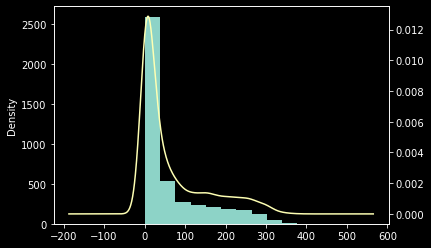

In [256]:

ax = players_output.tot_games.plot(kind='hist')
players_output.tot_games.plot(kind='kde', ax=ax, secondary_y=True)

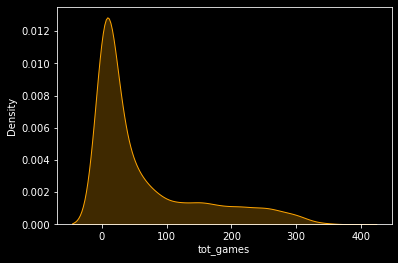

In [257]:
res = sns.kdeplot(players_output.tot_games, color='orange', shade='True')
plt.show()

In [258]:
df_players_profile2 = players_output.loc[(players_output["winrate"] < 95) & (players_output["tot_games"] >= 0)]
df_players_profile2_tot_games = df_players_profile2["tot_games"]
df_players_profile2_tot_games.sort_values()

10        1.0
611       1.0
617       1.0
619       1.0
621       1.0
        ...  
2470    349.0
2349    349.0
2473    356.0
2246    363.0
4132    377.0
Name: tot_games, Length: 4360, dtype: float64

In [259]:
players_output_num = df_players_profile2[df_players_profile2._get_numeric_data().columns]
players_output_num = players_output_num.loc[:, ["age", "ht", "df_mean", "1stIn_mean", "2ndWon_mean",	"SvGms_mean", "bpSaved_mean", "bpFaced_mean", "tot_games", "winrate", "ace_on_service(%)", "df_on_service(%)", "point_on_first_service(%)", "tie_break_rate(%)"]]
players_output_num

,age,ht,df_mean,1stIn_mean,2ndWon_mean,SvGms_mean,bpSaved_mean,bpFaced_mean,tot_games,winrate,ace_on_service(%),df_on_service(%),point_on_first_service(%),tie_break_rate(%)
10,19,185,1,66,14,14,1,5,1.0,0.00,5.62,1.12,60.61,0.00
11,18,185,0,38,9,10,1,5,1.0,0.00,3.39,0.00,60.53,0.00
12,27,185,5,47,18,11,8,12,1.0,0.00,1.14,5.68,61.70,0.00
13,26,185,5,52,9,9,6,10,3.0,33.33,4.48,6.73,63.46,0.00
14,22,185,1,37,11,9,2,5,2.0,0.00,9.01,2.70,60.81,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4365,28,177,3,43,11,10,4,8,190.0,42.63,2.22,4.97,62.46,8.42
4366,26,177,3,43,10,10,3,7,70.0,37.14,1.95,4.27,61.59,1.43
4367,28,177,4,43,11,10,3,7,198.0,63.13,2.48,5.76,63.73,11.11
4368,20,177,3,43,10,9,3,8,59.0,30.51,2.03,4.42,60.45,8.47


In [260]:
players_output.to_csv("players_profile.csv", index=False)

In [261]:
players_output

,id,name,sex,ioc,age,ht,hand,rank,df_mean,1stIn_mean,2ndWon_mean,SvGms_mean,bpSaved_mean,bpFaced_mean,tot_games,winrate,ace_on_service(%),df_on_service(%),point_on_first_service(%),Hard_win(%),Clay_win(%),Grass_win(%),Carpet_win(%),Hard_los(%),Clay_los(%),Grass_los(%),Carpet_los(%),Best_Surface,Worste_Surface,tie_break_rate(%)
0,105935,Duilio Beretta,Male,PER,25,185,R,1428,1,27,12,8,2,2,1.0,100.00,4.76,2.38,77.78,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,Clay,None,0.00
1,126502,Luis Diego Chavez Villalpando,Male,ESP,22,185,U,1581,2,43,14,11,3,4,1.0,100.00,5.71,2.86,74.42,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,Clay,None,0.00
2,138845,Anthony Jackie Tang,Male,HKG,19,185,U,1519,4,41,22,11,4,7,1.0,100.00,7.41,4.94,70.73,100.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Hard,None,100.00
3,202165,Alberto Lim,Male,PHI,18,185,R,1371,5,37,15,10,4,6,1.0,100.00,13.85,7.69,72.97,100.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Hard,None,0.00
4,134886,Sharmal Dissanayake,Male,SRI,21,185,R,1455,5,46,9,11,2,7,1.0,100.00,1.52,7.58,56.52,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,Clay,None,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4365,202478,Tara Moore,Female,GBR,28,177,R,454,3,43,11,10,4,8,190.0,42.63,2.22,4.97,62.46,28.42,4.21,7.89,2.11,35.79,8.42,9.47,3.68,Hard,Hard,8.42
4366,205922,Chanelle Van Nguyen,Female,USA,26,177,U,627,3,43,10,10,3,7,70.0,37.14,1.95,4.27,61.59,22.86,14.29,0.00,0.00,37.14,25.71,0.00,0.00,Hard,Hard,1.43
4367,201554,Vitalia Diatchenko,Female,RUS,28,177,R,176,4,43,11,10,3,7,198.0,63.13,2.48,5.76,63.73,54.04,3.54,5.56,0.00,26.77,6.57,3.54,0.00,Hard,Hard,11.11
4368,214562,Ingrid Neel,Female,USA,20,177,U,704,3,43,10,9,3,8,59.0,30.51,2.03,4.42,60.45,8.47,18.64,1.69,1.69,38.98,22.03,5.08,3.39,Clay,Hard,8.47
